<a href="https://colab.research.google.com/github/TyamanovaMargo/identification/blob/main/classificationChunck_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#IMPORT

In [1]:
!pip install torch


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 51.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [2]:
from torch.optim import AdamW


In [3]:
import zipfile
import os
!pip install babel
#from datetime import date, datetime
import time as time_
from babel.dates import format_date, format_datetime, format_time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
from transformers import AutoModel, BertTokenizerFast
import time
t0 = time.time()
!pip install transformers
from sklearn.metrics import classification_report, confusion_matrix


#ACTION

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
#with punctuation
zip_file_path = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual/action_dataset_new.zip"
extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks'

#without punctuation
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_action'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks'

#first chunk
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunk_action'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks'

# #low_case+punctuation
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/Action_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks'

#all_test_dataset_final
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/Final_dataset_multi/FINAL_dataset_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks'



In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Colab Notebooks/Dataset_actual/action_dataset_new.zip'

In [ ]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class
    return data, labels



In [ ]:
data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/action_dataset_new'#with punctuation
# data_dir = '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_action'
# data_dir ='/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunk_action'
# data_dir ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/Action_lowcase_punctuation'
# data_dir ="/content/drive/MyDrive/Colab Notebooks/Final_dataset_multi/FINAL_dataset_punctuation"


# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# # Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [ ]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 1004  labels = 1004
Positive = 502  negative = 502
Majority = 0.5


In [ ]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [ ]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [ ]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,#?????????
                                                                    stratify=train_labels)

In [ ]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  803
Test size  256
Val size  201


####Bert model and tokenaizer

In [ ]:
## import BERT-base pretrained model
#DeepPavlov/xlm-roberta-large-en-ru
#DeepPavlov/rubert-base-cased
#bert-base-multilingual-cased
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


###DeepPavlov model

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")


Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
# max_seq_len = 300 #without punct
max_seq_len = 500 #with punct

# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [ ]:
# Просмотр содержимого словаря для тренировочных данных
print("Train tokens:")
print(tokens_train.keys())  # Вывод ключей словаря
print(tokens_train['input_ids'])  # Вывод закодированных предложений
print(tokens_train['attention_mask'])  # Вывод маски внимания

# Просмотр содержимого словаря для валидационных данных
print("\nValidation tokens:")
print(tokens_val.keys())
print(tokens_val['input_ids'])
print(tokens_val['attention_mask'])

# Просмотр содержимого словаря для тестовых данных
print("\nTest tokens:")
print(tokens_test.keys())
print(tokens_test['input_ids'])
print(tokens_test['attention_mask'])


Train tokens:
dict_keys(['input_ids', 'attention_mask'])
[[101, 18890, 80369, 18126, 10625, 551, 10277, 54187, 10227, 117, 61381, 15768, 47274, 30659, 119, 100, 12624, 10351, 11060, 117, 50272, 41744, 98955, 67456, 13390, 119, 512, 17969, 10513, 53204, 12753, 117, 10375, 564, 14655, 10517, 78736, 13480, 61342, 14133, 119, 100, 30417, 117, 543, 52629, 11602, 83317, 10696, 117, 553, 17969, 67124, 14208, 117, 100, 67738, 10277, 54187, 117, 96917, 55490, 117, 558, 35415, 32307, 33693, 10385, 10122, 559, 41914, 94936, 119, 84171, 11582, 557, 18291, 10513, 41102, 12621, 117, 103909, 47970, 67482, 117, 11279, 17516, 543, 72712, 67126, 45321, 60092, 10375, 558, 55354, 119, 526, 43333, 543, 28867, 71792, 544, 19954, 10752, 19240, 26149, 10783, 117, 10375, 34509, 11833, 68734, 118, 11663, 55895, 60649, 19097, 558, 10439, 32579, 23855, 14350, 72813, 117, 541, 15283, 12709, 32934, 48873, 106347, 10696, 11191, 117, 10297, 48997, 17780, 558, 16522, 33276, 19517, 10241, 12709, 19900, 70351, 16610, 55

In [ ]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [ ]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
# from transformers import AdamW
from torch.optim import AdamW
from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

[1.00124688 0.99875622]


In [ ]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)

    # compute the training loss of the epoch
    avg_loss = total_loss / len(train_dataloader)

    # predictions are in the form of (no. of batches, size of batch, no. of classes).
    # reshape the predictions in form of (number of samples, no. of classes)
    total_preds  = np.concatenate(total_preds, axis=0)

    #returns the loss and predictions
    return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]



#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    # train_loss, _ = train()
    train_loss, train_preds = train()

    #evaluate model
    # valid_loss, _ = evaluate()
    valid_loss, valid_preds = evaluate()

    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_action_with_punctuation_bml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')



 Epoch 1 / 16
train: step 1

Evaluating...
  Batch    50  of    101.
  Batch   100  of    101.

Training Loss: 0.002
Validation Loss: 0.712

 Epoch 2 / 16
train: step 1

Evaluating...
  Batch    50  of    101.
  Batch   100  of    101.

Training Loss: 0.002
Validation Loss: 0.699

 Epoch 3 / 16
train: step 1

Evaluating...
  Batch    50  of    101.
  Batch   100  of    101.

Training Loss: 0.002
Validation Loss: 0.706

 Epoch 4 / 16
train: step 1

Evaluating...
  Batch    50  of    101.
  Batch   100  of    101.

Training Loss: 0.001
Validation Loss: 0.741

 Epoch 5 / 16
train: step 1

Evaluating...
  Batch    50  of    101.
  Batch   100  of    101.

Training Loss: 0.002
Validation Loss: 0.763

 Epoch 6 / 16
train: step 1

Evaluating...
  Batch    50  of    101.
  Batch   100  of    101.

Training Loss: 0.001
Validation Loss: 0.804

 Epoch 7 / 16
train: step 1

Evaluating...
  Batch    50  of    101.
  Batch   100  of    101.

Training Loss: 0.001
Validation Loss: 0.870

 Epoch 8 / 1

## test the model

In [ ]:
#load weights of best model
path = '/content/saved_weights_action_with_punctuation_bml.pt'
#path = '/content/drive/MyDrive/Colab Notebooks/Dataset_without_punctuation+weights/saved_weights/saved_weights_action_62.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.53      0.70      0.60       128
           1       0.55      0.37      0.44       128

    accuracy                           0.54       256
   macro avg       0.54      0.54      0.52       256
weighted avg       0.54      0.54      0.52       256

---------->   P        R       F1       Acc
----------> 0.5396284829721363  &  0.53515625  &  0.5216606214769105  &  0.53515625
Confusion Matrix:
[[90 38]
 [81 47]]


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_action_low_case.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[-0.11085285 -0.22037067]
 [-0.22813922  0.04921765]
 [-0.2391029   0.07599012]
 [-0.17852333  0.03822369]
 [-0.13251503 -0.0749068 ]
 [-0.14858457 -0.04966697]
 [-0.26002014 -0.01188919]
 [-0.11383706 -0.04433816]
 [-0.12062192 -0.08608921]
 [-0.02572107 -0.21202774]
 [-0.22090775  0.05057121]
 [-0.23478526  0.06409795]
 [-0.20216066  0.04885803]
 [-0.18707547 -0.05869379]
 [-0.28730384  0.10687333]
 [-0.2421968  -0.0010624 ]
 [-0.07534927 -0.23756106]
 [-0.19931775  0.12872282]
 [-0.09285989 -0.16737965]
 [-0.19635701 -0.0421896 ]
 [-0.09388243 -0.09582457]
 [-0.22453305  0.09015924]
 [-0.24190421  0.03200038]
 [-0.20509738 -0.16444865]
 [-0.05227742 -0.27410787]
 [-0.05169991 -0.16862085]
 [-0.15133724 -0.06346949]
 [-0.22741094  0.03049698]
 [-0.2641192  -0.00732968]
 [-0.23666757  0.16834791]
 [ 0.00735231 -0.29656512]
 [-0.10660131 -0.19869271]
 [-0.13370644 -0.01667308]
 [-0.22822745  0.0451527 ]
 [-0.16829859 -0.06286986]
 [-0.17688408  0.0408709 ]
 [-0.3100016   0.11212

In [ ]:
#  import numpy as np

# # Загрузить данные из файла
# data = np.load('/content/predictions_before_argmax.npz')

# # Получить доступ к массивам данных
# for key in data.keys():
#     print(key)  # Вывести названия массивов
#     array = data[key]  # Получить доступ к массиву по ключу

#     # Применить Softmax к массиву
#     softmax_array = np.exp(array) / np.sum(np.exp(array), axis=0)

#     print(softmax_array)  # Вывести результаты



arr_0
[[0.00414523 0.00364828]
 [0.00444832 0.00332112]
 [0.00362231 0.00421274]
 [0.00380148 0.00401934]
 [0.00395217 0.00385668]
 [0.00416925 0.00362235]
 [0.0036354  0.00419862]
 [0.00405964 0.00374067]
 [0.00354595 0.00429517]
 [0.00365784 0.0041744 ]
 [0.00378228 0.00404007]
 [0.00346449 0.00438311]
 [0.00358275 0.00425546]
 [0.00459678 0.00316086]
 [0.00373972 0.00408601]
 [0.00378402 0.00403819]
 [0.00391334 0.0038986 ]
 [0.00312907 0.00474518]
 [0.00372691 0.00409984]
 [0.0037691  0.0040543 ]
 [0.00414003 0.0036539 ]
 [0.0042038  0.00358507]
 [0.00392846 0.00388228]
 [0.00384812 0.003969  ]
 [0.00393343 0.00387691]
 [0.00377431 0.00404868]
 [0.00384787 0.00396926]
 [0.003852   0.00396482]
 [0.00429946 0.0034818 ]
 [0.00397405 0.00383307]
 [0.00318679 0.00468287]
 [0.00315748 0.00471451]
 [0.00400219 0.00380269]
 [0.00442906 0.00334191]
 [0.00388403 0.00393024]
 [0.00447855 0.00328849]
 [0.00359632 0.00424081]
 [0.00418503 0.00360533]
 [0.0035083  0.00433582]
 [0.00399077 0.0038

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить массив данных
array = data['arr_0']

# Применить Softmax к каждой строке массива
softmax_array = np.exp(array) / np.sum(np.exp(array), axis=1, keepdims=True)

print(softmax_array)


[[0.55086124 0.4491388 ]
 [0.59113806 0.40886194]
 [0.4813706  0.5186294 ]
 [0.5051802  0.49481985]
 [0.52520543 0.4747946 ]
 [0.5540536  0.44594643]
 [0.48310927 0.51689076]
 [0.53948706 0.460513  ]
 [0.47122303 0.52877694]
 [0.48609164 0.5139084 ]
 [0.5026281  0.49737194]
 [0.46039692 0.53960305]
 [0.4761124  0.52388763]
 [0.61086726 0.38913274]
 [0.49697274 0.5030273 ]
 [0.5028598  0.49714023]
 [0.52004504 0.47995502]
 [0.41582313 0.5841769 ]
 [0.49527004 0.50473   ]
 [0.5008767  0.4991233 ]
 [0.5501701  0.44982988]
 [0.5586439  0.4413561 ]
 [0.5220544  0.47794566]
 [0.5113781  0.48862192]
 [0.5227148  0.47728524]
 [0.5015687  0.49843135]
 [0.5113453  0.48865467]
 [0.5118929  0.48810706]
 [0.57135665 0.42864338]
 [0.5281128  0.47188717]
 [0.42349374 0.5765063 ]
 [0.4195988  0.5804012 ]
 [0.5318525  0.46814758]
 [0.58857876 0.41142124]
 [0.51614964 0.4838504 ]
 [0.5951555  0.40484452]
 [0.4779156  0.52208436]
 [0.55614966 0.4438503 ]
 [0.46621943 0.53378063]
 [0.530335   0.46966496]


###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0]


Compare labels :Predict and Original

In [ ]:

test_data = TensorDataset(test_seq, test_mask, test_y)
test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


In [ ]:
def predict(model, test_dataloader):
    model.eval()
    all_predictions, all_original_labels = [], []
    with torch.no_grad():
        for batch_idx, (data, mask, target) in enumerate(test_dataloader):
            output = model(data, mask)
            all_predictions.extend(output.argmax(dim=1).cpu().detach().numpy())
            all_original_labels.extend(target.cpu().detach().numpy())
    return all_predictions, all_original_labels

In [ ]:
# push the model to CPU
# model = model.to(device)
model = model

# predict the labels and original labels for the test set
test_predictions, test_original_labels = predict(model, test_dataloader)

# print the predicted and original labels
print("Predicted labels:")
print(test_predictions)

print("Original labels:")
print(test_original_labels)

Predicted labels:
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0]
Original labels:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

#FANTASY

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
#with punctuation
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual/fantasy_dataset_new.zip"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#without punctuatuion
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_fantasy.zip"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

# first_chunks
# zip_file_path ="/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunk_fantasy"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#low_case_punct
# zip_file_path ="/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/fantasy_lowcase_punctuation"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'


#multi
# zip_file_path ="/content/drive/MyDrive/Colab Notebooks/Multilabel_dataset"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'


In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [ ]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class

    return data, labels

In [ ]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_fantasy' #without punctuation
# data_dir ="/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunk_fantasy"
# data_dir="/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/fantasy_lowcase_punctuation"
data_dir = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/fantasy_dataset_new"

# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [ ]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 1582  labels = 1582
Positive = 791  negative = 791
Majority = 0.5


In [ ]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [ ]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [ ]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,
                                                                    stratify=train_labels)

In [ ]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  1265
Test size  400
Val size  317


##Bert-multi

In [ ]:
## import BERT-base pretrained model
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/714M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

##DeepPavlov

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
max_seq_len = 500 # 300 without punctuation
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [ ]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [ ]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 #32

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1)

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      # x = self.softmax(x)

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
from torch.optim import AdamW
from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3)


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16

[1.00079114 0.99921011]


In [ ]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)

  # compute the training loss of the epoch
  avg_loss = total_loss / len(train_dataloader)

  # predictions are in the form of (no. of batches, size of batch, no. of classes).
  # reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  #returns the loss and predictions
  return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]

#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()

    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_fantasy_without_punct_ml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')


 Epoch 1 / 16
train: step 1
  Batch    50  of    633.
  Batch   100  of    633.
  Batch   150  of    633.
  Batch   200  of    633.
  Batch   250  of    633.
  Batch   300  of    633.
  Batch   350  of    633.
  Batch   400  of    633.
  Batch   450  of    633.
  Batch   500  of    633.
  Batch   550  of    633.
  Batch   600  of    633.

Evaluating...
  Batch    50  of    159.
  Batch   100  of    159.
  Batch   150  of    159.

Training Loss: 0.732
Validation Loss: 0.701

 Epoch 2 / 16
train: step 1
  Batch    50  of    633.
  Batch   100  of    633.
  Batch   150  of    633.
  Batch   200  of    633.
  Batch   250  of    633.
  Batch   300  of    633.
  Batch   350  of    633.
  Batch   400  of    633.
  Batch   450  of    633.
  Batch   500  of    633.
  Batch   550  of    633.
  Batch   600  of    633.

Evaluating...
  Batch    50  of    159.
  Batch   100  of    159.
  Batch   150  of    159.

Training Loss: 0.710
Validation Loss: 0.688

 Epoch 3 / 16
train: step 1
  Batch    50

##test the model

In [ ]:
#load weights of best model
path = '/content/saved_weights_fantasy_without_punct_ml.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.66      0.67      0.66       200
           1       0.66      0.65      0.65       200

    accuracy                           0.66       400
   macro avg       0.66      0.66      0.66       400
weighted avg       0.66      0.66      0.66       400

---------->   P        R       F1       Acc
----------> 0.6575354454752319  &  0.6575  &  0.6574807332912476  &  0.6575
Confusion Matrix:
[[133  67]
 [ 70 130]]


In [ ]:
print("Shape of test_y:", test_y.shape)
print("Shape of preds_argmax:", preds.shape)


Shape of test_y: torch.Size([410])
Shape of preds_argmax: torch.Size([410])


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_fantasy_without_punct_ml.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[-6.00695372e-01  5.53614318e-01]
 [ 2.17020184e-01 -2.57949114e-01]
 [-2.45850801e-01  2.07962796e-01]
 [-1.00837171e+00  9.54576790e-01]
 [-3.62306744e-01  3.34370315e-01]
 [-2.90647089e-01  1.89046606e-01]
 [-7.92664468e-01  7.16497481e-01]
 [-1.05010629e+00  9.28164721e-01]
 [-5.82730532e-01  5.41422904e-01]
 [ 6.13333285e-01 -6.86937749e-01]
 [-4.22131777e-01  3.85010004e-01]
 [ 1.08417779e-01 -1.13500535e-01]
 [-4.42524254e-01  4.43221837e-01]
 [-7.35230148e-01  6.61623001e-01]
 [ 2.42869943e-01 -3.52909625e-01]
 [-5.98429322e-01  5.50447047e-01]
 [-6.77557051e-01  6.38133526e-01]
 [-1.37280405e+00  1.30977130e+00]
 [-9.81732905e-01  9.68270838e-01]
 [-7.29954958e-01  6.90453470e-01]
 [ 7.97625542e-01 -8.97090018e-01]
 [-6.75448418e-01  6.23256922e-01]
 [-2.85193443e-01  3.11822772e-01]
 [-9.20413911e-01  8.57578993e-01]
 [-6.26497805e-01  5.71384668e-01]
 [ 2.62850583e-01 -3.08198422e-01]
 [-1.41716707e+00  1.38261867e+00]
 [ 2.10064888e-01 -2.43061915e-01]
 [-4.24829066e

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 0 1 1 0 1 1 1
 1 0 0 1 1 1 1 0 0 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1 0 0 1 1 1 0 0 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 1 1 1 1 1 0
 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 1
 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 0 0 1 1 0 0 0 1
 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 1 1 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 1 1 1 1 0 0 0 0 0 0 1
 1 1 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 1 1 1
 1 1 0 0 0 1 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0
 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 1 1 0 0 0 1 1 0 1 0 0 1 0 1 0
 0 1 1]


#DETECTIVE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/Dataset_detective.zip"

#with punctuation
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/detective_dataset_new2"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#withou punctuation
zip_file_path = "/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_detective"
extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunks
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunks_detective"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#low_case_punct
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/detective_lowcase_punctuation"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

IsADirectoryError: [Errno 21] Is a directory: '/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunks_detective'

In [ ]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class

    return data, labels

In [ ]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_detective'
# data_dir ='/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunks_detective'
# data_dir ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/detective_lowcase_punctuation'
data_dir = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/detective_dataset_new2"

# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [ ]:


print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))# Assuming train_labels and test_labels are lists of labels
print("Train Labels:", train_labels)
print("Test Labels:", test_labels)


Train Labels: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

In [ ]:
# print("Found data items =", len(train_data), " labels =", len(train_labels))
# print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
# maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
# print("Majority =", maj)
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  1578
Test size  400
Val size  317


In [ ]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [ ]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [ ]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,
                                                                    stratify=train_labels)

In [ ]:
# Print shapes of train and validation data
print("Shape of train_text:", len(train_text))
print("Shape of train_labels:", len(train_labels))
print("Shape of val_text:", len(val_text))
print("Shape of val_labels:", len(val_labels))

# Print some example data points
print("Example train_text:", train_text[:5])  # Print first 5 elements
print("Example train_labels:", train_labels[:5])
print("Example val_text:", val_text[:5])
print("Example val_labels:", val_labels[:5])

Shape of train_text: 1302
Shape of train_labels: 1302
Shape of val_text: 326
Shape of val_labels: 326
Example train_text: ['держалась она слегка надменно Что с нашей дочерью спросила она Огрид говорит вы попали в засаду где Нимфадора Не знаю ответил Гарри Мы не знаем про остальных Тед с женой переглянулись и у Гарри внутри все сжалось от страха и раскаяния если кто то погиб виноват он он один Зачем согласился на эту авантюру зачем дал свои волосы Портшлюс вдруг вспомнил он Нам надо в Гнездо мы там выясним И пришлем известие Или сама Бомс как только С Дорой все будет хорошо Дромеда успокоил Тед Она свое дело знает не первый день в аврорах Бывала в переделках Портшлюс здесь сказал он Гарри Отправление через три минуты если вам интересно Да конечно Гарри вскинул рюкзак на плечо Я Он смотрел на миссис Бомс и хотел попросить прощения за то что оставляет ее в такой тревоге заверить что он сознает свою ответственность и ему очень очень жаль но все слова приходившие на ум казались пустыми и не

In [ ]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  1302
Test size  410
Val size  326


##Bert-multi

In [ ]:
## import BERT-base pretrained model
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

##DeepPavlov

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
max_seq_len = 500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [ ]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [ ]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 #32

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1)

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      # x = self.softmax(x)

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
from torch.optim import AdamW
from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3)


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16

[1. 1.]


In [ ]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)

  # compute the training loss of the epoch
  avg_loss = total_loss / len(train_dataloader)

  # predictions are in the form of (no. of batches, size of batch, no. of classes).
  # reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  #returns the loss and predictions
  return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]

#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()

    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_detective_with_punct_bml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')



 Epoch 1 / 16
train: step 1
  Batch    50  of    631.
  Batch   100  of    631.
  Batch   150  of    631.
  Batch   200  of    631.
  Batch   250  of    631.
  Batch   300  of    631.
  Batch   350  of    631.
  Batch   400  of    631.
  Batch   450  of    631.
  Batch   500  of    631.
  Batch   550  of    631.
  Batch   600  of    631.

Evaluating...
  Batch    50  of    158.
  Batch   100  of    158.
  Batch   150  of    158.

Training Loss: 0.746
Validation Loss: 0.667

 Epoch 2 / 16
train: step 1
  Batch    50  of    631.
  Batch   100  of    631.
  Batch   150  of    631.
  Batch   200  of    631.
  Batch   250  of    631.
  Batch   300  of    631.
  Batch   350  of    631.
  Batch   400  of    631.
  Batch   450  of    631.
  Batch   500  of    631.
  Batch   550  of    631.
  Batch   600  of    631.

Evaluating...
  Batch    50  of    158.
  Batch   100  of    158.
  Batch   150  of    158.

Training Loss: 0.727
Validation Loss: 0.755

 Epoch 3 / 16
train: step 1
  Batch    50

##test the model

In [ ]:
#load weights of best model
path = '/content/saved_weights_detective_with_punct_bml.pt'
#path = '/content/drive/MyDrive/Colab Notebooks/Dataset_without_punctuation+weights/saved_weights/saved_weights_action_62.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.73      0.56      0.63       200
           1       0.64      0.79      0.71       200

    accuracy                           0.67       400
   macro avg       0.68      0.67      0.67       400
weighted avg       0.68      0.67      0.67       400

---------->   P        R       F1       Acc
----------> 0.6825831547193777  &  0.6725000000000001  &  0.6679151535892415  &  0.6725
Confusion Matrix:
[[111  89]
 [ 42 158]]


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_detective_without_punct_ml.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[-0.59853697 -0.79765284]
 [-0.6901961  -0.69610703]
 [-0.62970376 -0.76088995]
 [-0.631502   -0.75884354]
 [-0.71448016 -0.6722598 ]
 [-0.6199658  -0.77211   ]
 [-0.6294517  -0.76117754]
 [-0.63175786 -0.758553  ]
 [-0.64451045 -0.74427086]
 [-0.66747725 -0.7194934 ]
 [-0.6291491  -0.7615229 ]
 [-0.67348117 -0.7132078 ]
 [-0.6556218  -0.73213583]
 [-0.66330045 -0.72391224]
 [-0.65375596 -0.734154  ]
 [-0.5796143  -0.82124054]
 [-0.6396912  -0.749623  ]
 [-0.62771666 -0.7631605 ]
 [-0.65443903 -0.73341423]
 [-0.6294172  -0.7612169 ]
 [-0.6783424  -0.7081744 ]
 [-0.6482543  -0.7401506 ]
 [-0.6402217  -0.7490311 ]
 [-0.64236534 -0.74664646]
 [-0.65599805 -0.73172975]
 [-0.6136117  -0.77955943]
 [-0.6345879  -0.7553501 ]
 [-0.62225026 -0.7694566 ]
 [-0.6234466  -0.76807237]
 [-0.64852506 -0.7398539 ]
 [-0.6752798  -0.71133965]
 [-0.6612408  -0.72610515]
 [-0.6146774  -0.77830285]
 [-0.63790995 -0.7516149 ]
 [-0.74741876 -0.6416701 ]
 [-0.67513347 -0.7114912 ]
 [-0.6612692  -0.72607

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0]


Compare labels :Predict and Original

In [ ]:

test_data = TensorDataset(test_seq, test_mask, test_y)
test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


In [ ]:
def predict(model, test_dataloader):
    model.eval()
    all_predictions, all_original_labels = [], []
    with torch.no_grad():
        for batch_idx, (data, mask, target) in enumerate(test_dataloader):
            output = model(data, mask)
            all_predictions.extend(output.argmax(dim=1).cpu().detach().numpy())
            all_original_labels.extend(target.cpu().detach().numpy())
    return all_predictions, all_original_labels

In [ ]:
# push the model to CPU
# model = model.to(device)
model = model

# predict the labels and original labels for the test set
test_predictions, test_original_labels = predict(model, test_dataloader)

# print the predicted and original labels
print("Predicted labels:")
print(test_predictions)

print("Original labels:")
print(test_original_labels)

Predicted labels:
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0]
Original labels:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
#load weights of best model
path = 'saved_weights_detective.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
pd.options.display.float_format = '{:.4f}%'.format
pd.crosstab(test_y, preds)

              precision    recall  f1-score   support

           0       0.65      0.73      0.68       205
           1       0.69      0.60      0.64       205

    accuracy                           0.66       410
   macro avg       0.67      0.66      0.66       410
weighted avg       0.67      0.66      0.66       410

---------->   P        R       F1       Acc
----------> 0.666086241505236  &  0.6634146341463414  &  0.662055619266055  &  0.6634146341463415


col_0,0,1
row_0,,
0,149,56
1,82,123


#SCIENCE FICTION

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
#with punctuation
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual/fantastic_dataset_new.zip"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#without ounctuation
zip_file_path ='/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_fantastic.zip'
extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunk
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunk_fantastica'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#low_case
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/fantastic_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [ ]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class

    return data, labels

In [ ]:
data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/fantastic_dataset_new'
# data_dir ='/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_fantastic'
# data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/fantastic_lowcase_punctuation'


# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [ ]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [ ]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [ ]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20, # изменила с 25 на 20
                                                                    stratify=train_labels)

In [ ]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  1578
Test size  400
Val size  316


##Bert-multi

In [ ]:
## import BERT-base pretrained model
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

##DeepPavlov

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
max_seq_len = 500 #500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [ ]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [ ]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
from torch.optim import AdamW
from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

[1. 1.]


In [ ]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)# сохранять

  # compute the training loss of the epoch
  avg_loss = total_loss / len(train_dataloader)

  # predictions are in the form of (no. of batches, size of batch, no. of classes).
  # reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  #returns the loss and predictions
  return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []#

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]

#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()

    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_SF_with_punctuation_bml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')



 Epoch 1 / 16
train: step 1
  Batch    50  of    789.
  Batch   100  of    789.
  Batch   150  of    789.
  Batch   200  of    789.
  Batch   250  of    789.
  Batch   300  of    789.
  Batch   350  of    789.
  Batch   400  of    789.
  Batch   450  of    789.
  Batch   500  of    789.
  Batch   550  of    789.
  Batch   600  of    789.
  Batch   650  of    789.
  Batch   700  of    789.
  Batch   750  of    789.

Evaluating...
  Batch    50  of    158.
  Batch   100  of    158.
  Batch   150  of    158.

Training Loss: 0.714
Validation Loss: 0.789

 Epoch 2 / 16
train: step 1
  Batch    50  of    789.
  Batch   100  of    789.
  Batch   150  of    789.
  Batch   200  of    789.
  Batch   250  of    789.
  Batch   300  of    789.
  Batch   350  of    789.
  Batch   400  of    789.
  Batch   450  of    789.
  Batch   500  of    789.
  Batch   550  of    789.
  Batch   600  of    789.
  Batch   650  of    789.
  Batch   700  of    789.
  Batch   750  of    789.

Evaluating...
  Batch  

## test the model

In [ ]:
#load weights of best model
path = '/content/saved_weights_SF_with_punctuation_bml.pt'
#path = '/content/drive/MyDrive/Colab Notebooks/Dataset_without_punctuation+weights/saved_weights/saved_weights_action_62.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.52      0.98      0.68       200
           1       0.83      0.07      0.14       200

    accuracy                           0.53       400
   macro avg       0.67      0.53      0.41       400
weighted avg       0.67      0.53      0.41       400

---------->   P        R       F1       Acc
----------> 0.6745200698080279  &  0.53  &  0.4072953119581324  &  0.53
Confusion Matrix:
[[197   3]
 [185  15]]


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_SF_without_punctuation_ml.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


<ipython-input-18-3970964c0113>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[-0.59853697 -0.79765284]
 [-0.6901961  -0.69610703]
 [-0.62970376 -0.76088995]
 [-0.631502   -0.75884354]
 [-0.71448016 -0.6722598 ]
 [-0.6199658  -0.77211   ]
 [-0.6294517  -0.76117754]
 [-0.63175786 -0.758553  ]
 [-0.64451045 -0.74427086]
 [-0.66747725 -0.7194934 ]
 [-0.6291491  -0.7615229 ]
 [-0.67348117 -0.7132078 ]
 [-0.6556218  -0.73213583]
 [-0.66330045 -0.72391224]
 [-0.65375596 -0.734154  ]
 [-0.5796143  -0.82124054]
 [-0.6396912  -0.749623  ]
 [-0.62771666 -0.7631605 ]
 [-0.65443903 -0.73341423]
 [-0.6294172  -0.7612169 ]
 [-0.6783424  -0.7081744 ]
 [-0.6482543  -0.7401506 ]
 [-0.6402217  -0.7490311 ]
 [-0.64236534 -0.74664646]
 [-0.65599805 -0.73172975]
 [-0.6136117  -0.77955943]
 [-0.6345879  -0.7553501 ]
 [-0.62225026 -0.7694566 ]
 [-0.6234466  -0.76807237]
 [-0.64852506 -0.7398539 ]
 [-0.6752798  -0.71133965]
 [-0.6612408  -0.72610515]
 [-0.6146774  -0.77830285]
 [-0.63790995 -0.7516149 ]
 [-0.74741876 -0.6416701 ]
 [-0.67513347 -0.7114912 ]
 [-0.6612692  -0.72607

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0]


Compare labels :Predict and Original

In [ ]:

test_data = TensorDataset(test_seq, test_mask, test_y)
test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


In [ ]:
def predict(model, test_dataloader):
    model.eval()
    all_predictions, all_original_labels = [], []
    with torch.no_grad():
        for batch_idx, (data, mask, target) in enumerate(test_dataloader):
            output = model(data, mask)
            all_predictions.extend(output.argmax(dim=1).cpu().detach().numpy())
            all_original_labels.extend(target.cpu().detach().numpy())
    return all_predictions, all_original_labels

In [ ]:
# push the model to CPU
# model = model.to(device)
model = model

# predict the labels and original labels for the test set
test_predictions, test_original_labels = predict(model, test_dataloader)

# print the predicted and original labels
print("Predicted labels:")
print(test_predictions)

print("Original labels:")
print(test_original_labels)

Predicted labels:
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0]
Original labels:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

#ROMANCE

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
#with punctuation
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual/romance_dataset_new.zip"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#without punctuatioan
zip_file_path = "/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_roman"
extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunk
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunks_romantica'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#low_case_punct
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/romance_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'


In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [5]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class

    return data, labels

In [73]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks/romance_dataset_new'
# data_dir = '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_roman'
# data_dir ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/romance_lowcase_punctuation'
data_dir = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/romance_dataset_new"

# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [7]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 1586  labels = 1586
Positive = 793  negative = 793
Majority = 0.5


In [8]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [9]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [10]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,
                                                                    stratify=train_labels)

In [11]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  1268
Test size  400
Val size  318


##Bert-multi

In [12]:
## import BERT-base pretrained model
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/714M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

##DeepPavlov

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [13]:
max_seq_len = 500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [14]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [15]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
from torch.optim import AdamW
from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

[1. 1.]


In [16]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)# сохранять

  # compute the training loss of the epoch
  avg_loss = total_loss / len(train_dataloader)

  # predictions are in the form of (no. of batches, size of batch, no. of classes).
  # reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  #returns the loss and predictions
  return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []#

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]

#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()

    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weightsRoman_with_punct_blm.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')



 Epoch 1 / 16
train: step 1
  Batch    50  of    634.
  Batch   100  of    634.
  Batch   150  of    634.
  Batch   200  of    634.
  Batch   250  of    634.
  Batch   300  of    634.
  Batch   350  of    634.
  Batch   400  of    634.
  Batch   450  of    634.
  Batch   500  of    634.
  Batch   550  of    634.
  Batch   600  of    634.

Evaluating...
  Batch    50  of    159.
  Batch   100  of    159.
  Batch   150  of    159.

Training Loss: 0.736
Validation Loss: 0.665

 Epoch 2 / 16
train: step 1
  Batch    50  of    634.
  Batch   100  of    634.
  Batch   150  of    634.
  Batch   200  of    634.
  Batch   250  of    634.
  Batch   300  of    634.
  Batch   350  of    634.
  Batch   400  of    634.
  Batch   450  of    634.
  Batch   500  of    634.
  Batch   550  of    634.
  Batch   600  of    634.

Evaluating...
  Batch    50  of    159.
  Batch   100  of    159.
  Batch   150  of    159.

Training Loss: 0.712
Validation Loss: 0.698

 Epoch 3 / 16
train: step 1
  Batch    50

## test the model

In [17]:
#load weights of best model
# path = 'saved_weightsRoman_first_chunk.pt'
#path = '/content/drive/MyDrive/Colab Notebooks/Dataset_without_punctuation+weights/saved_weights/saved_weights_action_62.pt'
path = '/content/saved_weightsRoman_with_punct_blm.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.73      0.48      0.58       200
           1       0.61      0.82      0.70       200

    accuracy                           0.65       400
   macro avg       0.67      0.65      0.64       400
weighted avg       0.67      0.65      0.64       400

---------->   P        R       F1       Acc
----------> 0.669606512890095  &  0.6499999999999999  &  0.6395839769333744  &  0.65
Confusion Matrix:
[[ 96 104]
 [ 36 164]]


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
# model_path = '/content/saved_weightsRoman.pt'
model_path ='/content/saved_weightsRoman_without_punct_mlpt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


<ipython-input-34-e2c527e9e7a8>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[-0.59853697 -0.79765284]
 [-0.6901961  -0.69610703]
 [-0.62970376 -0.76088995]
 [-0.631502   -0.75884354]
 [-0.71448016 -0.6722598 ]
 [-0.6199658  -0.77211   ]
 [-0.6294517  -0.76117754]
 [-0.63175786 -0.758553  ]
 [-0.64451045 -0.74427086]
 [-0.66747725 -0.7194934 ]
 [-0.6291491  -0.7615229 ]
 [-0.67348117 -0.7132078 ]
 [-0.6556218  -0.73213583]
 [-0.66330045 -0.72391224]
 [-0.65375596 -0.734154  ]
 [-0.5796143  -0.82124054]
 [-0.6396912  -0.749623  ]
 [-0.62771666 -0.7631605 ]
 [-0.65443903 -0.73341423]
 [-0.6294172  -0.7612169 ]
 [-0.6783424  -0.7081744 ]
 [-0.6482543  -0.7401506 ]
 [-0.6402217  -0.7490311 ]
 [-0.64236534 -0.74664646]
 [-0.65599805 -0.73172975]
 [-0.6136117  -0.77955943]
 [-0.6345879  -0.7553501 ]
 [-0.62225026 -0.7694566 ]
 [-0.6234466  -0.76807237]
 [-0.64852506 -0.7398539 ]
 [-0.6752798  -0.71133965]
 [-0.6612408  -0.72610515]
 [-0.6146774  -0.77830285]
 [-0.63790995 -0.7516149 ]
 [-0.74741876 -0.6416701 ]
 [-0.67513347 -0.7114912 ]
 [-0.6612692  -0.72607

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0]


Compare labels :Predict and Original

In [ ]:

test_data = TensorDataset(test_seq, test_mask, test_y)
test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


In [ ]:
def predict(model, test_dataloader):
    model.eval()
    all_predictions, all_original_labels = [], []
    with torch.no_grad():
        for batch_idx, (data, mask, target) in enumerate(test_dataloader):
            output = model(data, mask)
            all_predictions.extend(output.argmax(dim=1).cpu().detach().numpy())
            all_original_labels.extend(target.cpu().detach().numpy())
    return all_predictions, all_original_labels

In [ ]:
# push the model to CPU
# model = model.to(device)
model = model

# predict the labels and original labels for the test set
test_predictions, test_original_labels = predict(model, test_dataloader)

# print the predicted and original labels
print("Predicted labels:")
print(test_predictions)

print("Original labels:")
print(test_original_labels)

Predicted labels:
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0]
Original labels:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

#CLASSIC

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Set the path to your zip file
#with punctuation
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/Classsicccccc"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#without punctuation
# zip_file_path = "/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_classic"
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunk
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunk_dataset_classic'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#low_case_punct
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/classic_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'


In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [19]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class

    return data, labels

In [20]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks/Classsicccccc'
# data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/classic_lowcase_punctuation'
# data_dir ="/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_classic"
data_dir = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/classic_dataset_new!"

# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x80 in position 3131: invalid start byte

In [ ]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 426  labels = 426
Positive = 213  negative = 213
Majority = 0.5


In [ ]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [ ]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [ ]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,
                                                                    stratify=train_labels)

In [ ]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  340
Test size  136
Val size  86


##Bert-multi

In [ ]:
## import BERT-base pretrained model
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

##DeepPavlov

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")

tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
max_seq_len = 500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:2870: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [ ]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [ ]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
from transformers import AdamW
from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


[1. 1.]


In [ ]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)# сохранять

  # compute the training loss of the epoch
  avg_loss = total_loss / len(train_dataloader)

  # predictions are in the form of (no. of batches, size of batch, no. of classes).
  # reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  #returns the loss and predictions
  return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []#

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]

#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()

    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weightsClassic_without_punct_ml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')



 Epoch 1 / 16
train: step 1
  Batch    50  of    170.
  Batch   100  of    170.
  Batch   150  of    170.

Evaluating...

Training Loss: 0.800
Validation Loss: 0.729

 Epoch 2 / 16
train: step 1
  Batch    50  of    170.
  Batch   100  of    170.
  Batch   150  of    170.

Evaluating...

Training Loss: 0.713
Validation Loss: 0.703

 Epoch 3 / 16
train: step 1
  Batch    50  of    170.
  Batch   100  of    170.
  Batch   150  of    170.

Evaluating...

Training Loss: 0.702
Validation Loss: 0.711

 Epoch 4 / 16
train: step 1
  Batch    50  of    170.
  Batch   100  of    170.
  Batch   150  of    170.

Evaluating...

Training Loss: 0.728
Validation Loss: 0.698

 Epoch 5 / 16
train: step 1
  Batch    50  of    170.
  Batch   100  of    170.
  Batch   150  of    170.

Evaluating...

Training Loss: 0.706
Validation Loss: 0.697

 Epoch 6 / 16
train: step 1
  Batch    50  of    170.
  Batch   100  of    170.
  Batch   150  of    170.

Evaluating...

Training Loss: 0.700
Validation Loss: 0.69

## test the model

In [ ]:
#load weights of best model
path = '/content/saved_weightsClassic_without_punct_ml.pt'
#path = '/content/drive/MyDrive/Colab Notebooks/Dataset_without_punctuation+weights/saved_weights/saved_weights_action_62.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

<ipython-input-18-4b30366fda4c>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path))


              precision    recall  f1-score   support

           0       0.53      0.31      0.39        68
           1       0.51      0.72      0.60        68

    accuracy                           0.51       136
   macro avg       0.52      0.51      0.49       136
weighted avg       0.52      0.51      0.49       136

---------->   P        R       F1       Acc
----------> 0.5177083333333333  &  0.5147058823529411  &  0.4932249322493225  &  0.5147058823529411
Confusion Matrix:
[[21 47]
 [19 49]]


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weightsClassic_without_punct_ml.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


<ipython-input-18-77ff5bd05ffd>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


#ERROR ANALIZE


In [ ]:
# Assuming your DataFrame 'df' contains the text data and labels
test_texts =test_text  # Extract the text data
test_y = test_y  # Extract the true labels

# Ensure the model is in evaluation mode
model.eval()

# Get predictions
with torch.no_grad():
    preds = model(test_seq, test_mask)
    preds_numpy = preds.detach().cpu().numpy()

# Convert logits to predicted class labels
predicted_labels = np.argmax(preds_numpy, axis=1)

# Create a detailed report including each sample's true and predicted labels
detailed_report = []

for i in range(len(test_y)):
    true_label = test_y[i]
    pred_label = predicted_labels[i]
    detailed_report.append({'Text': test_texts[i], 'True Label': true_label, 'Predicted Label': pred_label})

# Convert the report to a DataFrame for better visualization
import pandas as pd

df_report = pd.DataFrame(detailed_report)
print(df_report)

# Save the detailed report to a CSV (Optional)
df_report.to_csv('detailed_report.csv', index=False)

###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[-0.59853697 -0.79765284]
 [-0.6901961  -0.69610703]
 [-0.62970376 -0.76088995]
 [-0.631502   -0.75884354]
 [-0.71448016 -0.6722598 ]
 [-0.6199658  -0.77211   ]
 [-0.6294517  -0.76117754]
 [-0.63175786 -0.758553  ]
 [-0.64451045 -0.74427086]
 [-0.66747725 -0.7194934 ]
 [-0.6291491  -0.7615229 ]
 [-0.67348117 -0.7132078 ]
 [-0.6556218  -0.73213583]
 [-0.66330045 -0.72391224]
 [-0.65375596 -0.734154  ]
 [-0.5796143  -0.82124054]
 [-0.6396912  -0.749623  ]
 [-0.62771666 -0.7631605 ]
 [-0.65443903 -0.73341423]
 [-0.6294172  -0.7612169 ]
 [-0.6783424  -0.7081744 ]
 [-0.6482543  -0.7401506 ]
 [-0.6402217  -0.7490311 ]
 [-0.64236534 -0.74664646]
 [-0.65599805 -0.73172975]
 [-0.6136117  -0.77955943]
 [-0.6345879  -0.7553501 ]
 [-0.62225026 -0.7694566 ]
 [-0.6234466  -0.76807237]
 [-0.64852506 -0.7398539 ]
 [-0.6752798  -0.71133965]
 [-0.6612408  -0.72610515]
 [-0.6146774  -0.77830285]
 [-0.63790995 -0.7516149 ]
 [-0.74741876 -0.6416701 ]
 [-0.67513347 -0.7114912 ]
 [-0.6612692  -0.72607

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0]


Compare labels :Predict and Original

In [ ]:

test_data = TensorDataset(test_seq, test_mask, test_y)
test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


In [ ]:
def predict(model, test_dataloader):
    model.eval()
    all_predictions, all_original_labels = [], []
    with torch.no_grad():
        for batch_idx, (data, mask, target) in enumerate(test_dataloader):
            output = model(data, mask)
            all_predictions.extend(output.argmax(dim=1).cpu().detach().numpy())
            all_original_labels.extend(target.cpu().detach().numpy())
    return all_predictions, all_original_labels

In [ ]:
# push the model to CPU
# model = model.to(device)
model = model

# predict the labels and original labels for the test set
test_predictions, test_original_labels = predict(model, test_dataloader)

# print the predicted and original labels
print("Predicted labels:")
print(test_predictions)

print("Original labels:")
print(test_original_labels)

Predicted labels:
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0]
Original labels:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

#NonFICTION

In [27]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Set the path to your zip file
#with punctuation
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual/nonFiction_dataset_new.zip'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'
#without punctuation
zip_file_path = '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_NonFiction'
extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunk
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunk_dataset_nonFiction'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#low_case_punct
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/nonFiction_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

IsADirectoryError: [Errno 21] Is a directory: '/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/nonFiction_lowcase_punctuation'

In [28]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class
    return data, labels



In [29]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_NonFiction'
# data_dir ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/nonFiction_lowcase_punctuation'
data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/nonFiction_dataset_new'
# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [30]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 1416  labels = 1416
Positive = 708  negative = 708
Majority = 0.5


In [31]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [32]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [33]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,#?????????
                                                                    stratify=train_labels)

In [34]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  1132
Test size  356
Val size  284


##Bert model and tokenaizer

In [35]:
## import BERT-base pretrained model
#DeepPavlov/xlm-roberta-large-en-ru
#DeepPavlov/rubert-base-cased
#bert-base-multilingual-cased
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

##DeepPavlov model

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [36]:
max_seq_len = 500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [37]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [38]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
from torch.optim import AdamW
from sklearn.utils.class_weight import compute_class_weight
# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

[1. 1.]


In [39]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)

    # compute the training loss of the epoch
    avg_loss = total_loss / len(train_dataloader)

    # predictions are in the form of (no. of batches, size of batch, no. of classes).
    # reshape the predictions in form of (number of samples, no. of classes)
    total_preds  = np.concatenate(total_preds, axis=0)

    #returns the loss and predictions
    return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]



#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()


    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_nonfiction_without_punct_ml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')





 Epoch 1 / 16
train: step 1

Evaluating...
  Batch    50  of    142.
  Batch   100  of    142.

Training Loss: 0.001
Validation Loss: 0.691

 Epoch 2 / 16
train: step 1

Evaluating...
  Batch    50  of    142.
  Batch   100  of    142.

Training Loss: 0.001
Validation Loss: 0.717

 Epoch 3 / 16
train: step 1

Evaluating...
  Batch    50  of    142.
  Batch   100  of    142.

Training Loss: 0.002
Validation Loss: 0.714

 Epoch 4 / 16
train: step 1

Evaluating...
  Batch    50  of    142.
  Batch   100  of    142.

Training Loss: 0.001
Validation Loss: 0.705

 Epoch 5 / 16
train: step 1

Evaluating...
  Batch    50  of    142.
  Batch   100  of    142.

Training Loss: 0.001
Validation Loss: 0.709

 Epoch 6 / 16
train: step 1

Evaluating...
  Batch    50  of    142.
  Batch   100  of    142.

Training Loss: 0.001
Validation Loss: 0.707

 Epoch 7 / 16
train: step 1

Evaluating...
  Batch    50  of    142.
  Batch   100  of    142.

Training Loss: 0.001
Validation Loss: 0.712

 Epoch 8 / 1

##test the model

In [40]:
#load weights of best model
path = '/content/saved_weightsRoman_with_punct_blm.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.36      0.44      0.40       178
           1       0.28      0.21      0.24       178

    accuracy                           0.33       356
   macro avg       0.32      0.33      0.32       356
weighted avg       0.32      0.33      0.32       356

---------->   P        R       F1       Acc
----------> 0.31905142819051424  &  0.3286516853932584  &  0.3196273639598577  &  0.32865168539325845
Confusion Matrix:
[[ 79  99]
 [140  38]]


In [ ]:
print("Shape of test_y:", test_y.shape)
print("Shape of preds_argmax:", preds.shape)


Shape of test_y: torch.Size([400])
Shape of preds_argmax: (400,)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_nonfiction_without_punct_ml.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


<ipython-input-34-405b1a048cb6>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[ 8.50411654e-01 -5.45032263e-01]
 [ 3.35936099e-01 -9.13186073e-02]
 [ 3.78550798e-01 -1.36854783e-01]
 [ 3.03049237e-01  1.61706060e-02]
 [ 3.65686864e-01 -7.49788433e-02]
 [ 1.20411038e+00 -8.30723047e-01]
 [-5.88131666e-01  8.63035679e-01]
 [ 1.36143196e+00 -1.06194580e+00]
 [ 3.96152437e-01 -1.68802992e-01]
 [ 5.79887927e-01 -2.83339322e-01]
 [ 1.33024001e+00 -1.01655626e+00]
 [ 7.62691915e-01 -4.99112606e-01]
 [ 2.90186673e-01 -4.63498831e-02]
 [ 1.27873111e+00 -8.87466967e-01]
 [ 9.67936963e-02  1.91780299e-01]
 [-4.46159124e-01  8.05120468e-01]
 [ 4.45967615e-01 -1.94756463e-01]
 [-3.34871650e-01  5.98601878e-01]
 [ 1.15732931e-01  1.33348867e-01]
 [ 1.62148738e+00 -1.24602973e+00]
 [ 1.59151113e+00 -1.16870391e+00]
 [ 2.29408532e-01  1.54317617e-01]
 [-2.09651470e-01  5.60340643e-01]
 [ 1.34052849e+00 -1.03510332e+00]
 [ 2.15334937e-01  9.79310274e-03]
 [ 1.72379827e+00 -1.37848258e+00]
 [-9.33214799e-02  3.43589962e-01]
 [ 1.11070871e+00 -7.91247606e-01]
 [ 4.49283093e

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 1 0
 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0
 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 0 1 1 1 1
 1 1 0 0 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 0
 1 0 1 1 1 1 1 0 1 1 1 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1
 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 1
 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 0 0 1 1 1
 0 0 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1]


#Contemporary Literature



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
#with punctuation
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual/contemporary_lit_dataset_new.zip'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#without punctuation
zip_file_path ="/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_modern"
extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunk
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/First chunks datasets/First_chunk_dataset_ContemporaryLit'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#low_case_punct
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/contemporary_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [41]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class
    return data, labels



In [42]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks/contemporary_lit_dataset_new'
# data_dir = '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_modern'
# data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/contemporary_lowcase_punctuation'
data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/contemporary_lit_dataset_new'

# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [43]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 1280  labels = 1280
Positive = 640  negative = 640
Majority = 0.5


In [44]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [45]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [46]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,#?????????
                                                                    stratify=train_labels)

In [47]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  1024
Test size  324
Val size  256


##Bert model and tokenaizer

In [48]:
## import BERT-base pretrained model
#DeepPavlov/xlm-roberta-large-en-ru
#DeepPavlov/rubert-base-cased
#bert-base-multilingual-cased
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

##DeepPavlov model

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [49]:
max_seq_len = 500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [50]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [51]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
from torch.optim import AdamW
from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

[1. 1.]


In [52]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)

    # compute the training loss of the epoch
    avg_loss = total_loss / len(train_dataloader)

    # predictions are in the form of (no. of batches, size of batch, no. of classes).
    # reshape the predictions in form of (number of samples, no. of classes)
    total_preds  = np.concatenate(total_preds, axis=0)

    #returns the loss and predictions
    return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]



#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()


    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_ContempLit_without_punct_ml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')





 Epoch 1 / 16
train: step 1

Evaluating...
  Batch    50  of    128.
  Batch   100  of    128.

Training Loss: 0.001
Validation Loss: 0.734

 Epoch 2 / 16
train: step 1

Evaluating...
  Batch    50  of    128.
  Batch   100  of    128.

Training Loss: 0.001
Validation Loss: 0.796

 Epoch 3 / 16
train: step 1

Evaluating...
  Batch    50  of    128.
  Batch   100  of    128.

Training Loss: 0.003
Validation Loss: 0.779

 Epoch 4 / 16
train: step 1

Evaluating...
  Batch    50  of    128.
  Batch   100  of    128.

Training Loss: 0.001
Validation Loss: 0.810

 Epoch 5 / 16
train: step 1

Evaluating...
  Batch    50  of    128.
  Batch   100  of    128.

Training Loss: 0.002
Validation Loss: 0.801

 Epoch 6 / 16
train: step 1

Evaluating...
  Batch    50  of    128.
  Batch   100  of    128.

Training Loss: 0.003
Validation Loss: 0.768

 Epoch 7 / 16
train: step 1

Evaluating...
  Batch    50  of    128.
  Batch   100  of    128.

Training Loss: 0.002
Validation Loss: 0.732

 Epoch 8 / 1

##test the model

In [53]:
#load weights of best model
path = '/content/saved_weights_ContempLit_without_punct_ml.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.42      0.18      0.25       162
           1       0.48      0.75      0.59       162

    accuracy                           0.47       324
   macro avg       0.45      0.47      0.42       324
weighted avg       0.45      0.47      0.42       324

---------->   P        R       F1       Acc
----------> 0.44936061381074166  &  0.4660493827160494  &  0.4181070727833318  &  0.4660493827160494
Confusion Matrix:
[[ 29 133]
 [ 40 122]]


In [ ]:
print("Shape of test_y:", test_y.shape)
print("Shape of preds_argmax:", preds.shape)


Shape of test_y: torch.Size([400])
Shape of preds_argmax: (400,)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_ContempLit_without_punct_ml.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


<ipython-input-17-00e52a8e27bf>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))
/usr/local/lib/python3.10/dist-packages/sklear

###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[ 8.50411654e-01 -5.45032263e-01]
 [ 3.35936099e-01 -9.13186073e-02]
 [ 3.78550798e-01 -1.36854783e-01]
 [ 3.03049237e-01  1.61706060e-02]
 [ 3.65686864e-01 -7.49788433e-02]
 [ 1.20411038e+00 -8.30723047e-01]
 [-5.88131666e-01  8.63035679e-01]
 [ 1.36143196e+00 -1.06194580e+00]
 [ 3.96152437e-01 -1.68802992e-01]
 [ 5.79887927e-01 -2.83339322e-01]
 [ 1.33024001e+00 -1.01655626e+00]
 [ 7.62691915e-01 -4.99112606e-01]
 [ 2.90186673e-01 -4.63498831e-02]
 [ 1.27873111e+00 -8.87466967e-01]
 [ 9.67936963e-02  1.91780299e-01]
 [-4.46159124e-01  8.05120468e-01]
 [ 4.45967615e-01 -1.94756463e-01]
 [-3.34871650e-01  5.98601878e-01]
 [ 1.15732931e-01  1.33348867e-01]
 [ 1.62148738e+00 -1.24602973e+00]
 [ 1.59151113e+00 -1.16870391e+00]
 [ 2.29408532e-01  1.54317617e-01]
 [-2.09651470e-01  5.60340643e-01]
 [ 1.34052849e+00 -1.03510332e+00]
 [ 2.15334937e-01  9.79310274e-03]
 [ 1.72379827e+00 -1.37848258e+00]
 [-9.33214799e-02  3.43589962e-01]
 [ 1.11070871e+00 -7.91247606e-01]
 [ 4.49283093e

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 1 0
 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0
 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 0 1 1 1 1
 1 1 0 0 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 0
 1 0 1 1 1 1 1 0 1 1 1 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1
 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 1
 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 0 0 1 1 1
 0 0 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1]


#Novel,ShortStory

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
#with_punctuation
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual/novelShortStories_dataset_new.zip'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#without punctuation
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_novel_shortStory'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunk
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/novelShortStories_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#low_case_punct


In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [5]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class
    return data, labels



In [7]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks/novelShortStories_dataset_new'
# data_dir = "/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_novel_shortStory"
# data_dir ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/novelShortStories_lowcase_punctuation'
data_dir ="/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/novelShortStories_dataset_new"

# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [8]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 328  labels = 328
Positive = 164  negative = 164
Majority = 0.5


In [9]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [10]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [11]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,#?????????
                                                                    stratify=train_labels)

In [12]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  262
Test size  84
Val size  66


##Bert model and tokenaizer

In [13]:
## import BERT-base pretrained model
#DeepPavlov/xlm-roberta-large-en-ru
#DeepPavlov/rubert-base-cased
#bert-base-multilingual-cased
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/714M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

##DeepPavlov model

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [14]:
max_seq_len = 500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [15]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [16]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers

from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

[1. 1.]


In [17]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)

    # compute the training loss of the epoch
    avg_loss = total_loss / len(train_dataloader)

    # predictions are in the form of (no. of batches, size of batch, no. of classes).
    # reshape the predictions in form of (number of samples, no. of classes)
    total_preds  = np.concatenate(total_preds, axis=0)

    #returns the loss and predictions
    return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]



#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()


    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_shortStory_without_punct.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')





 Epoch 1 / 16
train: step 1

Evaluating...

Training Loss: 0.005
Validation Loss: 0.702

 Epoch 2 / 16
train: step 1

Evaluating...

Training Loss: 0.006
Validation Loss: 0.688

 Epoch 3 / 16
train: step 1

Evaluating...

Training Loss: 0.005
Validation Loss: 0.684

 Epoch 4 / 16
train: step 1

Evaluating...

Training Loss: 0.005
Validation Loss: 0.681

 Epoch 5 / 16
train: step 1

Evaluating...

Training Loss: 0.005
Validation Loss: 0.693

 Epoch 6 / 16
train: step 1

Evaluating...

Training Loss: 0.006
Validation Loss: 0.697

 Epoch 7 / 16
train: step 1

Evaluating...

Training Loss: 0.009
Validation Loss: 0.688

 Epoch 8 / 16
train: step 1

Evaluating...

Training Loss: 0.004
Validation Loss: 0.691

 Epoch 9 / 16
train: step 1

Evaluating...

Training Loss: 0.006
Validation Loss: 0.684

 Epoch 10 / 16
train: step 1

Evaluating...

Training Loss: 0.005
Validation Loss: 0.679

 Epoch 11 / 16
train: step 1

Evaluating...

Training Loss: 0.007
Validation Loss: 0.673

 Epoch 12 / 16
tra

##test the model

In [18]:
#load weights of best model
path = '/content/saved_weights_shortStory_without_punct.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.54      0.33      0.41        42
           1       0.52      0.71      0.60        42

    accuracy                           0.52        84
   macro avg       0.53      0.52      0.51        84
weighted avg       0.53      0.52      0.51        84

---------->   P        R       F1       Acc
----------> 0.5278514588859416  &  0.5238095238095238  &  0.5058823529411764  &  0.5238095238095238
Confusion Matrix:
[[14 28]
 [12 30]]


In [ ]:
print("Shape of test_y:", test_y.shape)
print("Shape of preds_argmax:", preds.shape)


Shape of test_y: torch.Size([400])
Shape of preds_argmax: (400,)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_shortStory_without_punct.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


<ipython-input-35-50b2a172371c>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[ 8.50411654e-01 -5.45032263e-01]
 [ 3.35936099e-01 -9.13186073e-02]
 [ 3.78550798e-01 -1.36854783e-01]
 [ 3.03049237e-01  1.61706060e-02]
 [ 3.65686864e-01 -7.49788433e-02]
 [ 1.20411038e+00 -8.30723047e-01]
 [-5.88131666e-01  8.63035679e-01]
 [ 1.36143196e+00 -1.06194580e+00]
 [ 3.96152437e-01 -1.68802992e-01]
 [ 5.79887927e-01 -2.83339322e-01]
 [ 1.33024001e+00 -1.01655626e+00]
 [ 7.62691915e-01 -4.99112606e-01]
 [ 2.90186673e-01 -4.63498831e-02]
 [ 1.27873111e+00 -8.87466967e-01]
 [ 9.67936963e-02  1.91780299e-01]
 [-4.46159124e-01  8.05120468e-01]
 [ 4.45967615e-01 -1.94756463e-01]
 [-3.34871650e-01  5.98601878e-01]
 [ 1.15732931e-01  1.33348867e-01]
 [ 1.62148738e+00 -1.24602973e+00]
 [ 1.59151113e+00 -1.16870391e+00]
 [ 2.29408532e-01  1.54317617e-01]
 [-2.09651470e-01  5.60340643e-01]
 [ 1.34052849e+00 -1.03510332e+00]
 [ 2.15334937e-01  9.79310274e-03]
 [ 1.72379827e+00 -1.37848258e+00]
 [-9.33214799e-02  3.43589962e-01]
 [ 1.11070871e+00 -7.91247606e-01]
 [ 4.49283093e

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 1 0
 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0
 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 0 1 1 1 1
 1 1 0 0 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 0
 1 0 1 1 1 1 1 0 1 1 1 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1
 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 1
 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 0 0 1 1 1
 0 0 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1]


#ADVENTURE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
#with punctuation
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual/adventure_dataset_new.zip'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#without_punctuation
zip_file_path ="/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_adventures"
extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunk
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/adventure_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [21]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class
    return data, labels



In [22]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks//adventure_dataset_new'
data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/adventure_dataset_new'
# data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/adventure_lowcase_punctuation'

# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [23]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 192  labels = 192
Positive = 96  negative = 96
Majority = 0.5


In [24]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [25]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [26]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,#?????????
                                                                    stratify=train_labels)

In [27]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  153
Test size  48
Val size  39


##Bert model and tokenaizer

In [28]:
## import BERT-base pretrained model
#DeepPavlov/xlm-roberta-large-en-ru
#DeepPavlov/rubert-base-cased
#bert-base-multilingual-cased
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

##DeepPavlov model

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [29]:
max_seq_len = 500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [30]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [31]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers

from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

[1.00657895 0.99350649]


In [32]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)

    # compute the training loss of the epoch
    avg_loss = total_loss / len(train_dataloader)

    # predictions are in the form of (no. of batches, size of batch, no. of classes).
    # reshape the predictions in form of (number of samples, no. of classes)
    total_preds  = np.concatenate(total_preds, axis=0)

    #returns the loss and predictions
    return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]



#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()


    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_adventure_without_punct_ml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')





 Epoch 1 / 16
train: step 1

Evaluating...

Training Loss: 0.009
Validation Loss: 0.697

 Epoch 2 / 16
train: step 1

Evaluating...

Training Loss: 0.011
Validation Loss: 0.698

 Epoch 3 / 16
train: step 1

Evaluating...

Training Loss: 0.008
Validation Loss: 0.735

 Epoch 4 / 16
train: step 1

Evaluating...

Training Loss: 0.013
Validation Loss: 0.734

 Epoch 5 / 16
train: step 1

Evaluating...

Training Loss: 0.013
Validation Loss: 0.711

 Epoch 6 / 16
train: step 1

Evaluating...

Training Loss: 0.010
Validation Loss: 0.694

 Epoch 7 / 16
train: step 1

Evaluating...

Training Loss: 0.009
Validation Loss: 0.703

 Epoch 8 / 16
train: step 1

Evaluating...

Training Loss: 0.010
Validation Loss: 0.726

 Epoch 9 / 16
train: step 1

Evaluating...

Training Loss: 0.012
Validation Loss: 0.736

 Epoch 10 / 16
train: step 1

Evaluating...

Training Loss: 0.009
Validation Loss: 0.745

 Epoch 11 / 16
train: step 1

Evaluating...

Training Loss: 0.014
Validation Loss: 0.739

 Epoch 12 / 16
tra

##test the model

In [33]:
#load weights of best model
path = '/content/saved_weights_adventure_without_punct_ml.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)

              precision    recall  f1-score   support

           0       0.45      0.42      0.43        24
           1       0.46      0.50      0.48        24

    accuracy                           0.46        48
   macro avg       0.46      0.46      0.46        48
weighted avg       0.46      0.46      0.46        48

---------->   P        R       F1       Acc
----------> 0.458041958041958  &  0.45833333333333337  &  0.45739130434782604  &  0.4583333333333333
Confusion Matrix:
[[10 14]
 [12 12]]


In [ ]:
print("Shape of test_y:", test_y.shape)
print("Shape of preds_argmax:", preds.shape)


Shape of test_y: torch.Size([400])
Shape of preds_argmax: (400,)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_adventure_without_punct_ml.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


<ipython-input-17-526a7aa23c5a>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[ 8.50411654e-01 -5.45032263e-01]
 [ 3.35936099e-01 -9.13186073e-02]
 [ 3.78550798e-01 -1.36854783e-01]
 [ 3.03049237e-01  1.61706060e-02]
 [ 3.65686864e-01 -7.49788433e-02]
 [ 1.20411038e+00 -8.30723047e-01]
 [-5.88131666e-01  8.63035679e-01]
 [ 1.36143196e+00 -1.06194580e+00]
 [ 3.96152437e-01 -1.68802992e-01]
 [ 5.79887927e-01 -2.83339322e-01]
 [ 1.33024001e+00 -1.01655626e+00]
 [ 7.62691915e-01 -4.99112606e-01]
 [ 2.90186673e-01 -4.63498831e-02]
 [ 1.27873111e+00 -8.87466967e-01]
 [ 9.67936963e-02  1.91780299e-01]
 [-4.46159124e-01  8.05120468e-01]
 [ 4.45967615e-01 -1.94756463e-01]
 [-3.34871650e-01  5.98601878e-01]
 [ 1.15732931e-01  1.33348867e-01]
 [ 1.62148738e+00 -1.24602973e+00]
 [ 1.59151113e+00 -1.16870391e+00]
 [ 2.29408532e-01  1.54317617e-01]
 [-2.09651470e-01  5.60340643e-01]
 [ 1.34052849e+00 -1.03510332e+00]
 [ 2.15334937e-01  9.79310274e-03]
 [ 1.72379827e+00 -1.37848258e+00]
 [-9.33214799e-02  3.43589962e-01]
 [ 1.11070871e+00 -7.91247606e-01]
 [ 4.49283093e

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 1 0
 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0
 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 0 1 1 1 1
 1 1 0 0 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 0
 1 0 1 1 1 1 1 0 1 1 1 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1
 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 1
 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 0 0 1 1 1
 0 0 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1]


#CHILDREN'S BOOK

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your zip file
#with punctuation
# zip_file_path = '/content/drive/MyDrive/Colab Notebooks/Dataset_actual/childrens_books_dataset_new.zip'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#without punctuation
zip_file_path = '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_childrens'
extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

#first chunk
# zip_file_path ='/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/childrens_lowcase_punctuation'
# extracted_folder_path = '/content/drive/MyDrive/Colab Notebooks/'

In [ ]:
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [34]:
def load_data(directory):
    data = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                file_path = os.path.join(label_dir, filename)
                if os.path.isfile(file_path):
                    with open(file_path, 'r', encoding='utf-8') as file:
                        chunk = file.read()
                        data.append(chunk)
                        labels.append(1 if label == 'pos' else 0)  # Assuming 'pos' is positive class
    return data, labels



In [47]:
# data_dir = '/content/drive/MyDrive/Colab Notebooks/childrens_books_dataset_new'
# data_dir =  '/content/drive/MyDrive/Colab Notebooks/NoDouble_dataset_without_punctuation/Dataset_childrens'
# data_dir = '/content/drive/MyDrive/Colab Notebooks/Dataset_LOWCASE_PUNCTUATION/childrens_lowcase_punctuation'
data_dir = "/content/drive/MyDrive/Colab Notebooks/Dataset_actual_with_punctuation/childrens_books_dataset_new"
# Load data from 'train' directory
train_data, train_labels = load_data(os.path.join(data_dir, 'train'))
# Load data from 'test' directory
test_data, test_labels = load_data(os.path.join(data_dir, 'test'))

In [48]:
print("Found data items =", len(train_data), " labels =", len(train_labels))
print("Positive =", train_labels.count(1), " negative =", train_labels.count(0))
maj = max(train_labels.count(1), train_labels.count(0)) / float(len(train_data))
print("Majority =", maj)

Found data items = 446  labels = 446
Positive = 223  negative = 223
Majority = 0.5


In [49]:
import re
def clean(stringliteral):
  #stringliteral='aaa http:\\blabla  bbb &gt @aaa'
  stringliteral=re.sub(r'http\S+', '', stringliteral)
  #stringliteral=re.sub(r'https\S+', '', stringliteral)
  stringliteral=re.sub(r'&\S+', '', stringliteral)
  stringliteral=re.sub(r'@\S+', '', stringliteral)
  #print(stringliteral)
  return stringliteral

def clean_data(data):
  cleandata=[clean(data[i]) for i in range(len(data))]
  return cleandata

In [50]:
train_text=clean_data(train_data)
test_text=clean_data(test_data)

In [51]:
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels,
                                                                    random_state=2018,
                                                                    test_size=0.20,#?????????
                                                                    stratify=train_labels)

In [52]:
print("Train size ",len(train_labels))
print("Test size ",len(test_labels))
print("Val size ",len(val_labels))

Train size  356
Test size  112
Val size  90


##Bert model and tokenaizer

In [41]:
## import BERT-base pretrained model
#DeepPavlov/xlm-roberta-large-en-ru
#DeepPavlov/rubert-base-cased
#bert-base-multilingual-cased
bert = AutoModel.from_pretrained('bert-base-multilingual-cased') #, return_dict=False)

# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-multilingual-cased')

##DeepPavlov model

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("DeepPavlov/rubert-base-cased")
bert = AutoModel.from_pretrained("DeepPavlov/rubert-base-cased")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/714M [00:00<?, ?B/s]

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [53]:
max_seq_len = 500
# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text, #.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:2700: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [54]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [55]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters
for param in bert.parameters():
    param.requires_grad = False

class BERT_Arch(nn.Module):

    def __init__(self, bert):

      super(BERT_Arch, self).__init__()

      self.bert = bert

      # dropout layer
      self.dropout = nn.Dropout(0.1)

      # relu activation function
      self.relu =  nn.ReLU()

      # dense layer 1
      self.fc1 = nn.Linear(768,512)

      # dense layer 2 (Output layer)
      self.fc2 = nn.Linear(512,2)

      #softmax activation function
      self.softmax = nn.LogSoftmax(dim=1) #тут поиграть чтобы убрать минусы чем ближе к 1 тем - число больше

    #define the forward pass
    def forward(self, sent_id, mask):

      #pass the inputs to the model
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)

      x = self.fc1(cls_hs)

      x = self.relu(x)

      x = self.dropout(x)

      # output layer
      x = self.fc2(x)

      # apply softmax activation
      #x = self.softmax(x).      deleet from the modals forward method

      return x

# pass the pre-trained BERT to our define architecture
model = BERT_Arch(bert)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers

from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr = 1e-3) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print(class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = nn.CrossEntropyLoss(weight=weights) #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

[1. 1.]


In [56]:
# function to train the model
def train():

  model.train()
  print("train: step 1")
  total_loss, total_accuracy = 0, 0

  # empty list to save model predictions
  total_preds=[]

  # iterate over batches
  for step,batch in enumerate(train_dataloader):
    #print("train: batch")
    # progress update after every 50 batches.
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))

    # push the batch to gpu
    #batch = [r.to(device) for r in batch]

    sent_id, mask, labels = batch

    # clear previously calculated gradients
    model.zero_grad()

    # get model predictions for the current batch
    preds = model(sent_id, mask)

    # compute the loss between actual and predicted values
    loss = cross_entropy(preds, labels)

    # add on to the total loss
    total_loss = total_loss + loss.item()

    # backward pass to calculate the gradients
    loss.backward()

    # clip the the gradients to 1.0. It helps in preventing the exploding gradient problem
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

    # update parameters
    optimizer.step()

    # model predictions are stored on GPU. So, push it to CPU
    preds=preds.detach().cpu().numpy()

    # append the model predictions
    total_preds.append(preds)

    # compute the training loss of the epoch
    avg_loss = total_loss / len(train_dataloader)

    # predictions are in the form of (no. of batches, size of batch, no. of classes).
    # reshape the predictions in form of (number of samples, no. of classes)
    total_preds  = np.concatenate(total_preds, axis=0)

    #returns the loss and predictions
    return avg_loss, total_preds


  # function for evaluating the model
def evaluate():

  print("\nEvaluating...")

  # deactivate dropout layers
  model.eval()

  total_loss, total_accuracy = 0, 0

  # empty list to save the model predictions
  total_preds = []

  # iterate over batches
  for step,batch in enumerate(val_dataloader):

    # Progress update every 50 batches.
    if step % 50 == 0 and not step == 0:

      # Calculate elapsed time in minutes.
      elapsed = format_time(time_.time() - t0)

      # Report progress.
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))

    # push the batch to gpu
    batch = [t for t in batch]

    sent_id, mask, labels = batch

    # deactivate autograd
    with torch.no_grad():

      # model predictions
      preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)

      total_loss = total_loss + loss.item()

      preds = preds.detach().cpu().numpy()

      total_preds.append(preds)

  # compute the validation loss of the epoch
  avg_loss = total_loss / len(val_dataloader)

  #reshape the predictions in form of (number of samples, no. of classes)
  total_preds  = np.concatenate(total_preds, axis=0)

  return avg_loss, total_preds

# set initial loss to infinite
best_valid_loss = float('inf')

# empty lists to store training and validation loss of each epoch
train_losses=[]
valid_losses=[]



#for each epoch
for epoch in range(epochs):

    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    #train model
    train_loss, _ = train()

    #evaluate model
    valid_loss, _ = evaluate()


    #save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_childrens_with_punct_ml.pt')

    # append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')





 Epoch 1 / 16
train: step 1

Evaluating...

Training Loss: 0.004
Validation Loss: 0.694

 Epoch 2 / 16
train: step 1

Evaluating...

Training Loss: 0.004
Validation Loss: 0.694

 Epoch 3 / 16
train: step 1

Evaluating...

Training Loss: 0.004
Validation Loss: 0.702

 Epoch 4 / 16
train: step 1

Evaluating...

Training Loss: 0.004
Validation Loss: 0.708

 Epoch 5 / 16
train: step 1

Evaluating...

Training Loss: 0.004
Validation Loss: 0.713

 Epoch 6 / 16
train: step 1

Evaluating...

Training Loss: 0.003
Validation Loss: 0.741

 Epoch 7 / 16
train: step 1

Evaluating...

Training Loss: 0.003
Validation Loss: 0.800

 Epoch 8 / 16
train: step 1

Evaluating...

Training Loss: 0.005
Validation Loss: 0.831

 Epoch 9 / 16
train: step 1

Evaluating...

Training Loss: 0.004
Validation Loss: 0.833

 Epoch 10 / 16
train: step 1

Evaluating...

Training Loss: 0.006
Validation Loss: 0.809

 Epoch 11 / 16
train: step 1

Evaluating...

Training Loss: 0.005
Validation Loss: 0.773

 Epoch 12 / 16
tra

##test the model

In [57]:
#load weights of best model
path = '/content/saved_weights_childrens_with_punct_ml.pt'
model.load_state_dict(torch.load(path))

# get predictions for test data
with torch.no_grad():
  preds = model(test_seq, test_mask)
  preds_numpy = preds.detach().cpu().numpy()

# model's performance
preds = np.argmax(preds, axis = 1)
print(classification_report(test_y, preds))

report=classification_report(test_labels, preds, output_dict=True)
P = report['macro avg']['precision']
R = report['macro avg']['recall']
F1 = report['macro avg']['f1-score']
accuracy = report['accuracy']
print("---------->   P        R       F1       Acc")
print("---------->", P, " & ", R, " & ", F1, " & ",accuracy)

# confusion matrix
# pd.options.display.float_format = '{:.4f}%'.format
# pd.crosstab(test_y, preds)

# confusion matrix
conf_matrix = confusion_matrix(test_y, preds)
print("Confusion Matrix:")
print(conf_matrix)


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        56
           1       0.50      0.98      0.66        56

    accuracy                           0.49       112
   macro avg       0.25      0.49      0.33       112
weighted avg       0.25      0.49      0.33       112

---------->   P        R       F1       Acc
----------> 0.24774774774774774  &  0.49107142857142855  &  0.32934131736526945  &  0.49107142857142855
Confusion Matrix:
[[ 0 56]
 [ 1 55]]


In [ ]:
print("Shape of test_y:", test_y.shape)
print("Shape of preds_argmax:", preds.shape)


Shape of test_y: torch.Size([400])
Shape of preds_argmax: (400,)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model
#model_path = '/content/drive/MyDrive/Colab Notebooks/saved_weights/saved_weights_action_62.pt'
model_path = '/content/saved_weights_adventure_without_punct_ml.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


<ipython-input-31-526a7aa23c5a>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


###Before_argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива


arr_0
[[-0.1059821   0.13442811]
 [-0.10331734  0.19614007]
 [-0.12184185  0.21542645]
 [-0.10507336  0.15099491]
 [-0.0908521   0.14287142]
 [-0.11063367  0.17549157]
 [-0.10342718  0.17536904]
 [-0.09430917  0.13116144]
 [-0.10771494  0.18339112]
 [-0.1025562   0.16305543]
 [-0.11072361  0.15367414]
 [-0.09523363  0.11757049]
 [-0.11118965  0.20754191]
 [-0.10917594  0.19954503]
 [-0.09754246  0.15343933]
 [-0.11065955  0.16583312]
 [-0.10998787  0.1950056 ]
 [-0.11875138  0.17455505]
 [-0.10029767  0.15835674]
 [-0.11063246  0.16064875]
 [-0.11023711  0.15684065]
 [-0.10093131  0.14249758]
 [-0.11011853  0.14717491]
 [-0.11574219  0.21459669]
 [-0.10396711  0.17242828]
 [-0.10820901  0.15813075]
 [-0.1071337   0.19266465]
 [-0.09610491  0.15052456]
 [-0.10502259  0.1678639 ]
 [-0.10839103  0.19038716]
 [-0.1090166   0.21107158]
 [-0.09798606  0.14657682]
 [-0.10333292  0.20323943]
 [-0.1157382   0.15991962]
 [-0.09033161  0.12823066]
 [-0.10617001  0.15262245]
 [-0.10729595  0.14497

###After_argmax


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax.npy')

# Вывести содержимое массива
print(predictions_after_argmax)



[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1]


#MULTILAYBELS


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle

# Define file path to your CSV file
csv_file_path = '/content/drive/MyDrive/Colab Notebooks/dataset2.csv'

# Load data from the CSV file
def load_data(csv_file_path):
    df = pd.read_csv(csv_file_path)
    return df['text'], df['label']

data, labels = load_data(csv_file_path)

# Shuffle the data
data, labels = shuffle(data, labels, random_state=2018)

# Encode labels
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# Create a DataFrame to view the shuffled data and encoded labels
df_shuffled = pd.DataFrame({
    'text': data,
    'original_label': labels,
    'encoded_label': encoded_labels
})

# Display the first few rows of the DataFrame
print(df_shuffled.head())

# Display the unique labels and their mappings
print("Unique labels and their mappings:")
print(label_encoder.classes_)


                                                   text  original_label  \
801   У нее тоже занятие с мистером Клейтоном. Прово...               6   
1179  Особенно наглядно выглядит «японское чудо» в с...               9   
767   Сковырнул все верхушки и слопал. Так что нет, ...               5   
1394  Но вчера, на интервью, Катя почему-то поверила...              10   
197   Или вообще расстаться? – Что? Господи, нет, Ми...               2   

      encoded_label  
801               6  
1179              9  
767               5  
1394             10  
197               2  
Unique labels and their mappings:
[ 0  1  2  3  4  5  6  7  8  9 10]


In [ ]:
# Initial split into train+val and test sets
train_val_text, test_text, train_val_labels, test_labels = train_test_split(
    data, encoded_labels,
    test_size=0.20,  # 20% of the data will be used for the test set
    random_state=2018,
    stratify=encoded_labels
)

# Further split train+val into train and val sets
train_text, val_text, train_labels, val_labels = train_test_split(
    train_val_text, train_val_labels,
    test_size=0.25,  # 25% of the 80% remaining data will be used for validation (i.e., 20% of the total data)
    random_state=2018,
    stratify=train_val_labels
)


In [ ]:
print("Train size ",len(train_labels))
print("Val size ",len(val_labels))
print("test size ",len(test_labels))

Train size  888
Val size  297
test size  297


In [ ]:
## import BERT-base pretrained model
from transformers import AutoConfig, AutoModelForSequenceClassification

model_name = "DeepPavlov/rubert-base-cased"

# Загрузите конфигурацию модели и установите количество меток
config = AutoConfig.from_pretrained(model_name)
config.num_labels = 11  # Установите количество классов
bert = AutoModelForSequenceClassification.from_pretrained(model_name, config=config)
tokenizer= AutoTokenizer.from_pretrained(model_name)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at DeepPavlov/rubert-base-cased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:

max_seq_len = 512

# Convert the pandas Series to a list
train_text_list = train_text.tolist()
val_text_list = val_text.tolist()
test_text_list = test_text.tolist()

# Tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text_list,
    max_length=max_seq_len,
    padding='max_length',
    truncation=True,
    return_token_type_ids=False
)

# Tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text_list,
    max_length=max_seq_len,
    padding='max_length',
    truncation=True,
    return_token_type_ids=False
)

# Tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text_list,
    max_length=max_seq_len,
    padding='max_length',
    truncation=True,
    return_token_type_ids=False
)

# Print a sample of the encoded tokens
print(tokens_train['input_ids'][:2])
print(tokens_val['input_ids'][:2])
print(tokens_test['input_ids'][:2])

[[101, 29195, 15291, 41628, 38634, 851, 8152, 14179, 1699, 38362, 1516, 15712, 104326, 128, 1641, 113998, 1714, 6213, 877, 13388, 876, 50522, 132, 57322, 21177, 1448, 5806, 27665, 35414, 3471, 132, 1022, 6301, 3629, 25796, 842, 166, 1022, 877, 17809, 43580, 869, 119113, 87830, 1519, 132, 1022, 29955, 2306, 59418, 51403, 5190, 24648, 1020, 1022, 877, 8542, 37834, 26292, 128, 109836, 851, 76348, 128, 851, 15369, 15365, 132, 1022, 98004, 2059, 25327, 1020, 105826, 851, 12286, 1020, 14912, 130, 869, 1020, 835, 130, 9490, 128, 2306, 128, 625, 612, 23458, 3998, 877, 166, 12341, 106, 14912, 106, 1022, 877, 59781, 82311, 77436, 132, 1022, 66672, 36872, 128, 8235, 3629, 32040, 51683, 6070, 128, 53939, 35125, 166, 29195, 2306, 61024, 47900, 10189, 9106, 128, 106210, 861, 106132, 106, 48687, 896, 118979, 50992, 74316, 24729, 851, 24640, 43190, 1502, 1020, 1022, 25725, 1020, 25725, 106, 1022, 17584, 13932, 1448, 85225, 132, 839, 17441, 65753, 23146, 861, 26063, 15509, 851, 37264, 78947, 94603, 616

In [ ]:
# Просмотр содержимого словаря для тренировочных данных
print("Train tokens:")
print(tokens_train.keys())  # Вывод ключей словаря
print(tokens_train['input_ids'])  # Вывод закодированных предложений
print(tokens_train['attention_mask'])  # Вывод маски внимания

# Просмотр содержимого словаря для валидационных данных
print("\nValidation tokens:")
print(tokens_val.keys())
print(tokens_val['input_ids'])
print(tokens_val['attention_mask'])

# Просмотр содержимого словаря для тестовых данных
print("\nTest tokens:")
print(tokens_test.keys())
print(tokens_test['input_ids'])
print(tokens_test['attention_mask'])

Train tokens:
dict_keys(['input_ids', 'attention_mask'])
[[101, 29195, 15291, 41628, 38634, 851, 8152, 14179, 1699, 38362, 1516, 15712, 104326, 128, 1641, 113998, 1714, 6213, 877, 13388, 876, 50522, 132, 57322, 21177, 1448, 5806, 27665, 35414, 3471, 132, 1022, 6301, 3629, 25796, 842, 166, 1022, 877, 17809, 43580, 869, 119113, 87830, 1519, 132, 1022, 29955, 2306, 59418, 51403, 5190, 24648, 1020, 1022, 877, 8542, 37834, 26292, 128, 109836, 851, 76348, 128, 851, 15369, 15365, 132, 1022, 98004, 2059, 25327, 1020, 105826, 851, 12286, 1020, 14912, 130, 869, 1020, 835, 130, 9490, 128, 2306, 128, 625, 612, 23458, 3998, 877, 166, 12341, 106, 14912, 106, 1022, 877, 59781, 82311, 77436, 132, 1022, 66672, 36872, 128, 8235, 3629, 32040, 51683, 6070, 128, 53939, 35125, 166, 29195, 2306, 61024, 47900, 10189, 9106, 128, 106210, 861, 106132, 106, 48687, 896, 118979, 50992, 74316, 24729, 851, 24640, 43190, 1502, 1020, 1022, 25725, 1020, 25725, 106, 1022, 17584, 13932, 1448, 85225, 132, 839, 17441, 65753

In [ ]:
# for train set
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels)

# for validation set
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels)

# for test set
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels)

In [ ]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from torch.nn import CrossEntropyLoss
import torch
import torch.nn as nn
#define a batch size
batch_size = 2 # from 16 till 64

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

# freeze all the parameters ЗДЕСЬ
# for param in bert.parameters():
#     param.requires_grad = False

class BERT_Arch(nn.Module):
    def __init__(self, bert, num_classes):
        super(BERT_Arch, self).__init__()
        self.bert = bert
        self.dropout = nn.Dropout(0.1)
        self.fc1 = nn.Linear(768, 512)  # Входная размерность = 768
        self.fc2 = nn.Linear(512, num_classes)  # Выходная размерность = num_classes

    def forward(self, sent_id, mask=None):
        outputs = self.bert(sent_id, attention_mask=mask)
        cls_hs = outputs[1]  # Используем второй элемент, который содержит pooled_output

        x = self.fc1(cls_hs)
        x = torch.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)

        return x
# pass the pre-trained BERT to our define architecture
num_classes = 11
model = BERT_Arch(bert,num_classes)

# push the model to GPU
#model = model.to(device)

# optimizer from hugging face transformers
from transformers import AdamW
from sklearn.utils.class_weight import compute_class_weight

# define the optimizer
optimizer = AdamW(model.parameters(), lr=2e-5) # можем менять 5e-5,3e-5, 2e-5; было -1e-3


#compute the class weights
class_wts = compute_class_weight(class_weight = "balanced",classes = np.unique(train_labels), y = train_labels)
#class_wts = compute_class_weight('balanced', np.unique(train_labels), train_labels)

print("Class Weights:", class_wts)

# convert class weights to tensor
weights= torch.tensor(class_wts,dtype=torch.float)
#weights = weights.to(device)

# loss function
cross_entropy = CrossEntropyLoss() #cross_entropy  = nn.NLLLoss(weight=weights)

# number of training epochs
epochs = 16 #7 Number of epochs: 2, 3, 4 от 5 до 20

Class Weights: [1.06220096 5.76623377 0.67272727 0.67272727 0.67272727 3.1048951
 0.67272727 1.4677686  2.37433155 0.76157804 0.83223993]


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


In [ ]:
# Function to train the model
import torch
import numpy as np
import torch.nn.functional as F

def train():
    model.train()
    total_loss, total_accuracy = 0, 0
    total_preds = []

    for step, batch in enumerate(train_dataloader):
        if step % 50 == 0 and step != 0:
            print('  Batch {:>5,} of {:>5,}.'.format(step, len(train_dataloader)))

        sent_id, mask, labels = batch

        # Get predictions from the model
        outputs = model(sent_id, mask)
        preds = outputs  # Прямые логиты от модели

        # Compute the loss
        loss = F.cross_entropy(preds, labels)
        total_loss += loss.item()

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        # Detach predictions and move to CPU
        preds = preds.detach().cpu().numpy()
        total_preds.append(preds)

    avg_loss = total_loss / len(train_dataloader)
    total_preds = np.concatenate(total_preds, axis=0)
    return avg_loss, total_preds

def evaluate():
    print("\nEvaluating...")
    model.eval()
    total_loss, total_accuracy = 0, 0
    total_preds = []

    for step, batch in enumerate(val_dataloader):
        if step % 50 == 0 and step != 0:
            print('  Batch {:>5,} of {:>5,}.'.format(step, len(val_dataloader)))

        sent_id, mask, labels = batch

        with torch.no_grad():
            outputs = model(sent_id, mask)
            preds = outputs  # Прямые логиты от модели
            loss = F.cross_entropy(preds, labels)
            total_loss += loss.item()

            preds = preds.detach().cpu().numpy()
            total_preds.append(preds)

    avg_loss = total_loss / len(val_dataloader)
    total_preds = np.concatenate(total_preds, axis=0)
    return avg_loss, total_preds





# Set initial loss to infinite
best_valid_loss = float('inf')

# Empty lists to store training and validation loss of each epoch
train_losses = []
valid_losses = []

# For each epoch
for epoch in range(epochs):
    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))

    # Train model
    train_loss, _ = train()

    # Evaluate model
    valid_loss, _ = evaluate()

    # Save the best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights_multiclass.pt')

    # Append training and validation loss
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')




 Epoch 1 / 16


IndexError: tuple index out of range

In [ ]:

import torch
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, recall_score

# List of model weight file paths
model_paths = [
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weightsClassic.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weightsRoman.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_ContempLit.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_SF.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_action.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_adventure.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_children.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_detective.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_fantasy.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_nonfiction.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_shortStory.pt',
]

# Define genre labels for clarity
genre_labels = {
    'action': 0,
    'adventure': 1,
    'detective': 2,
    'fantasy': 3,
    'SF': 4,
    'shortStories': 5,
    'romance': 6,
    'classic': 7,
    'childrens': 8,
    'nonFiction': 9,
    'contemporary': 10
}



# Function to load model and get predictions
def get_predictions(model_path, model, test_seq, test_mask):
    # Load model weights
    model.load_state_dict(torch.load(model_path))
    model.eval()

    # Get predictions for test data
    with torch.no_grad():
        preds = model(test_seq, test_mask)
        preds_numpy = preds.detach().cpu().numpy()

    # Get predictions after argmax
    preds_argmax = np.argmax(preds_numpy, axis=1)

    return preds_numpy, preds_argmax

# Initialize a list to store metrics for all models
metrics_list = []

# Loop through each model weight file and get results
for idx, model_path in enumerate(model_paths):
    # Get predictions
    preds_numpy, preds_argmax = get_predictions(model_path, model, test_seq, test_mask)

    # Save predictions before argmax (distribution arrays)
    np.savez(f'predictions_before_argmax_genre{idx+1}.npz', preds_numpy)

    # Save predictions after argmax
    np.save(f'predictions_after_argmax_genre{idx+1}.npy', preds_argmax)

    # Calculate and print metrics
    accuracy = accuracy_score(test_y, preds_argmax)
    f1 = f1_score(test_y, preds_argmax, average='weighted')
    recall = recall_score(test_y, preds_argmax, average='weighted')
    genre_name = list(genre_labels.keys())[list(genre_labels.values()).index(idx)]
    print(f"Model {idx+1} ({genre_name}): Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}")

    # Append metrics to the list
    metrics_list.append({'Model': genre_name, 'Accuracy': accuracy, 'F1 Score': f1, 'Recall': recall})

    # Get and save classification report
    report = classification_report(test_y, preds_argmax, target_names=list(genre_labels.keys()), output_dict=True)
    pd.DataFrame(report).transpose().to_csv(f'classification_report_genre{idx+1}.csv', index=False)

    # Get and save confusion matrix
    conf_matrix = confusion_matrix(test_y, preds_argmax)
    pd.DataFrame(conf_matrix).to_csv(f'confusion_matrix_genre{idx+1}.csv', index=False)

    print(f'Results saved for model {idx+1}')

# Save all metrics to a CSV file
metrics_df = pd.DataFrame(metrics_list)
metrics_df.to_csv('all_models_metrics.csv', index=False)
print("All metrics saved to all_models_metrics.csv")



Model 1 (action): Accuracy: 0.0875, F1 Score: 0.0166, Recall: 0.0875
Results saved for model 1


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 2 (adventure): Accuracy: 0.0471, F1 Score: 0.0102, Recall: 0.0471
Results saved for model 2


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 3 (detective): Accuracy: 0.0168, F1 Score: 0.0006, Recall: 0.0168
Results saved for model 3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 4 (fantasy): Accuracy: 0.0741, F1 Score: 0.0158, Recall: 0.0741
Results saved for model 4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 5 (SF): Accuracy: 0.0404, F1 Score: 0.0121, Recall: 0.0404
Results saved for model 5


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 6 (shortStories): Accuracy: 0.0168, F1 Score: 0.0006, Recall: 0.0168
Results saved for model 6


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 7 (romance): Accuracy: 0.0168, F1 Score: 0.0006, Recall: 0.0168
Results saved for model 7


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 8 (classic): Accuracy: 0.0337, F1 Score: 0.0081, Recall: 0.0337
Results saved for model 8


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 9 (childrens): Accuracy: 0.0640, F1 Score: 0.0146, Recall: 0.0640
Results saved for model 9


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 10 (nonFiction): Accuracy: 0.0370, F1 Score: 0.0105, Recall: 0.0370
Results saved for model 10


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model 11 (contemporary): Accuracy: 0.0640, F1 Score: 0.0137, Recall: 0.0640
Results saved for model 11
All metrics saved to all_models_metrics.csv


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import numpy as np
import pandas as pd

# Пути к файлам весов моделей
model_paths = [
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weightsClassic.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weightsRoman.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_ContempLit.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_SF.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_action.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_adventure.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_children.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_detective.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_fantasy.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_nonfiction.pt',
    '/content/drive/MyDrive/Colab Notebooks/SAVED_WEIGHT_WITH_PUNCTUATION/saved_weights_shortStory.pt',
]

# Функция для подсчета количества единиц в предсказаниях
def count_ones(preds_argmax):
    return np.sum(preds_argmax == 1)

# Создание списка для хранения DataFrame отчетов
report_list = []

# Обработка каждой модели
for idx, model_path in enumerate(model_paths):
    # Загрузка предсказаний после применения argmax
    preds_argmax = np.load(f'predictions_after_argmax_genre{idx+1}.npy')

    # Подсчет количества единиц
    ones_count = count_ones(preds_argmax)

    # Создание DataFrame для текущей модели
    model_report_df = pd.DataFrame({
        'Model': [f'Model {idx+1}'],
        'Number of 1s': [ones_count]
    })

    # Добавление DataFrame в список отчетов
    report_list.append(model_report_df)

    # Печать отчета для текущей модели
    print(f'Отчет для модели {idx+1}: Количество единиц: {ones_count}')

# Объединение всех отчетов в один DataFrame
final_report_df = pd.concat(report_list, ignore_index=True)

# Сохранение общего отчета в файл
final_report_df.to_csv('ones_count_report.csv', index=False)
print('Общий отчет сохранен в ones_count_report.csv')




Отчет для модели 1: Количество единиц: 52
Отчет для модели 2: Количество единиц: 91
Отчет для модели 3: Количество единиц: 297
Отчет для модели 4: Количество единиц: 99
Отчет для модели 5: Количество единиц: 201
Отчет для модели 6: Количество единиц: 297
Отчет для модели 7: Количество единиц: 297
Отчет для модели 8: Количество единиц: 123
Отчет для модели 9: Количество единиц: 141
Отчет для модели 10: Количество единиц: 152
Отчет для модели 11: Количество единиц: 94
Общий отчет сохранен в ones_count_report.csv


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


# Load weights of the model

model_path = '/content/saved_weights_children_low_case.pt'
model = model  # load model

model.load_state_dict(torch.load(model_path))

# # Get predictions for test data
# with torch.no_grad():
#     preds = model(test_seq, test_mask)
#     preds_numpy = preds.detach().cpu().numpy()

# Get predictions after argmax
preds_argmax = np.argmax(preds_numpy, axis=1)

# Save predictions before argmax (distribution arrays)
np.savez('predictions_before_argmax.npz', preds_numpy)

# Save predictions after argmax
np.save('predictions_after_argmax.npy', preds_argmax)

# Get and save classification report
report = classification_report(test_y, preds_argmax, output_dict=True)
pd.DataFrame(report).transpose().to_csv('classification_report.csv', index=False)

# Get and save confusion matrix
conf_matrix = confusion_matrix(test_y, preds_argmax)
pd.DataFrame(conf_matrix).to_csv('confusion_matrix.csv', index=False)


##Before argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
data = np.load('/content/predictions_before_argmax_genre1.npz')

# Получить доступ к массивам данных
for key in data.keys():
    print(key)  # Вывести названия массивов
    array = data[key]  # Получить доступ к массиву по ключу
    print(array)  # Вывести содержимое массива

arr_0
[[ 3.48438692e+00 -3.01175165e+00]
 [ 2.13784456e+00 -1.69113111e+00]
 [ 3.36428714e+00 -2.88670683e+00]
 [-1.34550524e+00  1.20737946e+00]
 [ 2.99638438e+00 -2.55097914e+00]
 [ 5.49887061e-01 -1.14149243e-01]
 [ 1.63156724e+00 -1.16321838e+00]
 [ 2.89721489e+00 -2.47048664e+00]
 [ 5.74018806e-02  3.80696416e-01]
 [ 2.20592284e+00 -1.74828053e+00]
 [ 1.88458204e+00 -1.44232333e+00]
 [ 3.72565866e+00 -3.23774910e+00]
 [ 2.44675469e+00 -1.99652219e+00]
 [ 4.93492508e+00 -4.39652967e+00]
 [ 4.58827853e-01 -2.24722065e-02]
 [ 2.47699022e+00 -1.99139476e+00]
 [-6.29866347e-02  4.87102151e-01]
 [ 2.96786118e+00 -2.43683052e+00]
 [ 2.14738560e+00 -1.72024488e+00]
 [ 1.20412791e+00 -7.65236497e-01]
 [ 1.41837525e+00 -9.39179301e-01]
 [ 3.55444574e+00 -3.05943203e+00]
 [ 2.70882130e+00 -2.23658586e+00]
 [ 4.01420689e+00 -3.53548980e+00]
 [-8.03187668e-01  1.19732928e+00]
 [-1.70134270e+00  2.09550524e+00]
 [ 3.81672287e+00 -3.35438585e+00]
 [ 3.49891007e-01  7.10925609e-02]
 [ 2.28071022e

##After argmax

In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax_genre1.npy')

# Вывести содержимое массива
print(predictions_after_argmax)

[0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1
 1 0 1 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0
 0 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0
 0]


In [ ]:
import numpy as np

# Загрузить данные из файла
predictions_after_argmax = np.load('/content/predictions_after_argmax_genre2.npy')

# Посчитать общее количество элементов
total_elements = predictions_after_argmax.size

# Посчитать количество элементов со значением 0 и 1
count_0 = np.sum(predictions_after_argmax == 0)
count_1 = np.sum(predictions_after_argmax == 1)

# Вывести результаты
print(f"Общее количество элементов: {total_elements}")
print(f"Количество элементов со значением 0: {count_0}")
print(f"Количество элементов со значением 1: {count_1}")


Общее количество элементов: 297
Количество элементов со значением 0: 206
Количество элементов со значением 1: 91


#TSNE


##WORD

tsne word

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE

# Читаем данные из CSV файла
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset_all_pos_dir_multiclass.csv')

# Получаем тексты из столбца 'text' и преобразуем в список
corpus = df['text'].tolist()

# Получаем метки из столбца 'label'
labels = df['label'].tolist()

# Определяем соответствие меток жанрам
genre_names = {
    0: 'action',
    1: 'adventure',
    2: 'detective',
    3: 'fantasy',
    4: 'SF',
    5: 'shortStories',
    6: 'romance',
    7: 'classic',
    8: 'childrens',
    9: 'nonFiction',
    10: 'contemporary'
}

custom_stopwords = [
    'и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его', 'но',
    'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще',
    'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть',
    'был', 'него', 'до', 'вас', 'нибудь', 'опять', 'уж', 'вам', 'ведь', 'там', 'потом', 'себя', 'ничего', 'ей',
    'может', 'они', 'тут', 'где', 'есть', 'надо', 'ней', 'для', 'мы', 'тебя', 'их', 'чем', 'была', 'сам', 'чтоб',
    'без', 'будто', 'чего', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'кто', 'этот', 'того', 'потому',
    'этого', 'какой', 'совсем', 'ним', 'здесь', 'этом', 'один', 'почти', 'мой', 'тем', 'чтобы', 'нее', 'сейчас',
    'были', 'куда', 'зачем', 'всех', 'никогда', 'можно', 'при', 'наконец', 'два', 'об', 'другой', 'хоть', 'после',
    'над', 'больше', 'тот', 'через', 'эти', 'нас', 'про', 'всего', 'них', 'какая', 'много', 'разве', 'три', 'эту',
    'моя', 'впрочем', 'хорошо', 'свою', 'этой', 'перед', 'иногда', 'лучше', 'чуть', 'том', 'нельзя', 'такой', 'им',
    'более', 'всегда', 'конечно', 'всю', 'между', 'также', 'которые'
]

def vectorize_and_display(corpus, labels, custom_stopwords, ngram_range):
    # Инициализируем CountVectorizer с пользовательскими стоп-словами и указанным ngram_range
    vectorizer = CountVectorizer(stop_words=custom_stopwords, encoding='utf-8', analyzer='word', ngram_range=ngram_range)

    # Преобразуем тексты в документно-терминную матрицу
    X = vectorizer.fit_transform(corpus)

    # Применяем t-SNE для уменьшения размерности до 2D
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X.toarray())

    # Визуализируем результаты
    plt.figure(figsize=(12, 8))

    # Используем метки для цвета точек
    unique_labels = sorted(set(labels))
    colors = plt.cm.get_cmap('tab20', len(unique_labels))  # Используем палитру табличных цветов
    label_to_color = {label: colors(i) for i, label in enumerate(unique_labels)}

    for label in unique_labels:
        indices = [i for i, lbl in enumerate(labels) if lbl == label]
        plt.scatter(X_tsne[indices, 0], X_tsne[indices, 1], c=[label_to_color[label]], label=genre_names[label], edgecolor='k', s=50)

    plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title(f't-SNE visualization of text data (ngram_range={ngram_range})')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.show()

# Применяем функцию к разным n-gram диапазонам
vectorize_and_display(corpus, labels, custom_stopwords, ngram_range=(1, 1))
vectorize_and_display(corpus, labels, custom_stopwords, ngram_range=(2, 2))
vectorize_and_display(corpus, labels, custom_stopwords, ngram_range=(3, 3))
vectorize_and_display(corpus, labels, custom_stopwords, ngram_range=(1, 3))



##CHAR


tsne char


/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:547: UserWarning: The parameter 'stop_words' will not be used since 'analyzer' != 'word'
  warnings.warn(


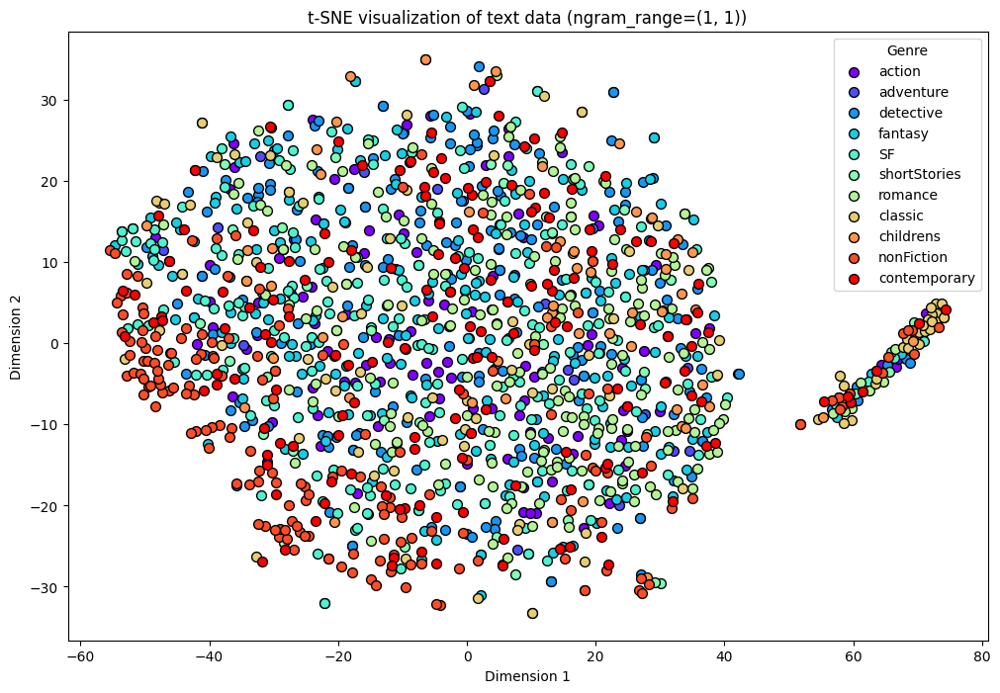

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:547: UserWarning: The parameter 'stop_words' will not be used since 'analyzer' != 'word'
  warnings.warn(


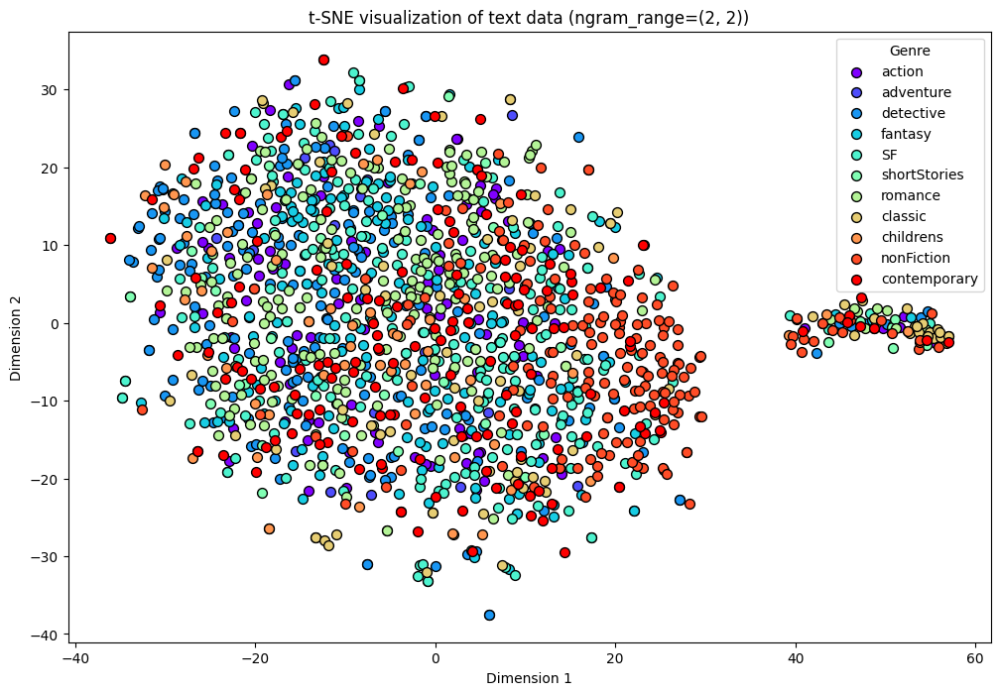

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:547: UserWarning: The parameter 'stop_words' will not be used since 'analyzer' != 'word'
  warnings.warn(


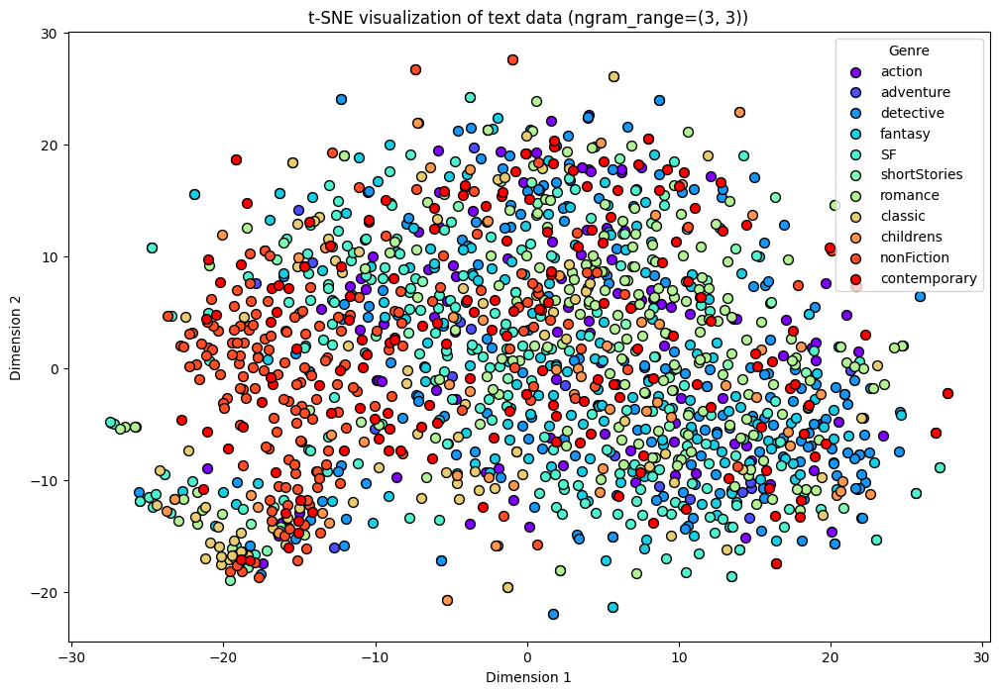

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:547: UserWarning: The parameter 'stop_words' will not be used since 'analyzer' != 'word'
  warnings.warn(


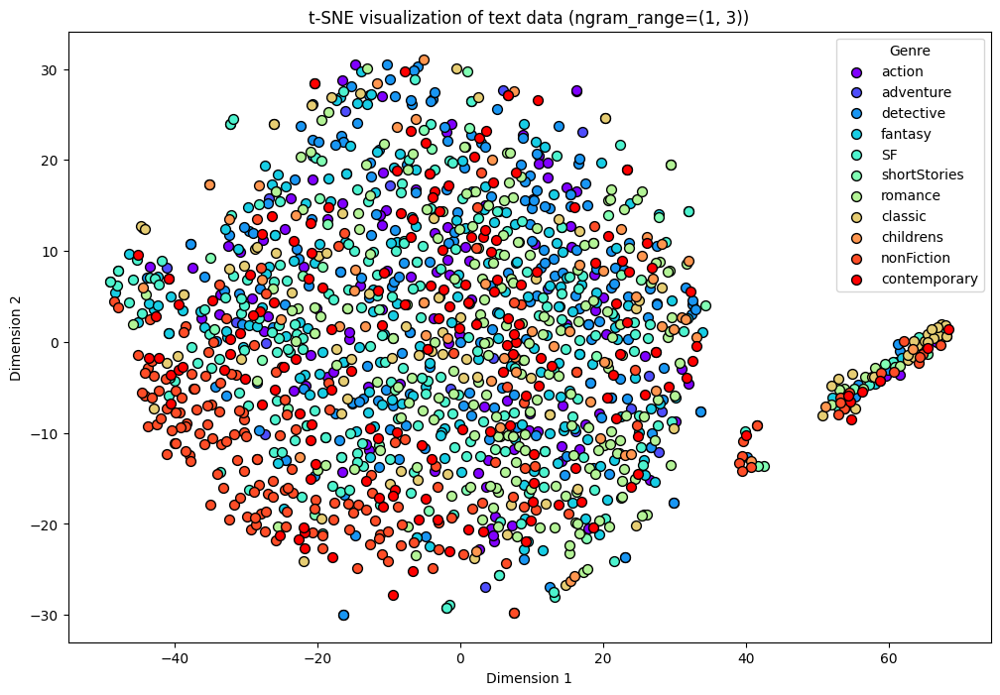

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE

# Читаем данные из CSV файла
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset2.csv')

# Получаем тексты из столбца 'text' и преобразуем в список
corpus = df['text'].tolist()

# Получаем метки из столбца 'label'
labels = df['label'].tolist()

# Определяем соответствие меток жанрам
genre_names = {
    0: 'action',
    1: 'adventure',
    2: 'detective',
    3: 'fantasy',
    4: 'SF',
    5: 'shortStories',
    6: 'romance',
    7: 'classic',
    8: 'childrens',
    9: 'nonFiction',
    10: 'contemporary'
}

def vectorize_and_display(corpus, labels, custom_stopwords, ngram_range):
    # Инициализируем CountVectorizer с указанным ngram_range
    vectorizer = CountVectorizer(stop_words=custom_stopwords, encoding='utf-8', analyzer='char', ngram_range=ngram_range)

    # Преобразуем тексты в документно-терминную матрицу
    X = vectorizer.fit_transform(corpus)

    # Применяем t-SNE для уменьшения размерности до 2D
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X.toarray())

    # Визуализируем результаты
    plt.figure(figsize=(12, 8))

    # Используем метки для цвета точек
    unique_labels = list(set(labels))
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
    label_to_color = {label: color for label, color in zip(unique_labels, colors)}

    for label in unique_labels:
        indices = [i for i, lbl in enumerate(labels) if lbl == label]
        plt.scatter(X_tsne[indices, 0], X_tsne[indices, 1], c=[label_to_color[label]], label=genre_names[label], edgecolor='k', s=50)

    plt.legend(title='Genre')
    plt.title(f't-SNE visualization of text data (ngram_range={ngram_range})')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.show()

# Применяем функцию к разным n-gram диапазонам
vectorize_and_display(corpus, labels, custom_stopwords, ngram_range=(1, 1))
vectorize_and_display(corpus, labels, custom_stopwords, ngram_range=(2, 2))
vectorize_and_display(corpus, labels, custom_stopwords, ngram_range=(3, 3))
vectorize_and_display(corpus, labels, custom_stopwords, ngram_range=(1, 3))


##TF_IDF

tsne tf-idf

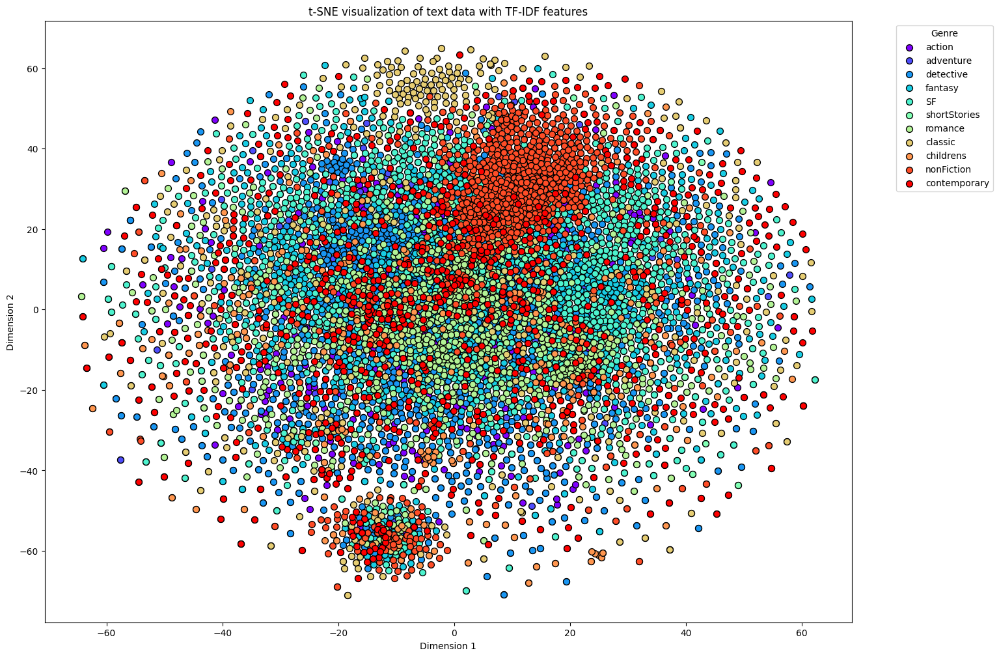

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE

# Читаем данные из CSV файла
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset_all_pos_dir_multiclass.csv')

# Получаем тексты и категории
corpus = df['text'].tolist()
categories = df['label'].tolist()

# Создаем словарь для отображения меток на графике
label_to_genre = {
    0: 'action',
    1: 'adventure',
    2: 'detective',
    3: 'fantasy',
    4: 'SF',
    5: 'shortStories',
    6: 'romance',
    7: 'classic',
    8: 'childrens',
    9: 'nonFiction',
    10: 'contemporary'
}

# Пользовательские стоп-слова
custom_stopwords = [
    'и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его', 'но',
    'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще',
    'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть',
    'был', 'него', 'до', 'вас', 'нибудь', 'опять', 'уж', 'вам', 'ведь', 'там', 'потом', 'себя', 'ничего', 'ей',
    'может', 'они', 'тут', 'где', 'есть', 'надо', 'ней', 'для', 'мы', 'тебя', 'их', 'чем', 'была', 'сам', 'чтоб',
    'без', 'будто', 'чего', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'кто', 'этот', 'того', 'потому',
    'этого', 'какой', 'совсем', 'ним', 'здесь', 'этом', 'один', 'почти', 'мой', 'тем', 'чтобы', 'нее', 'сейчас',
    'были', 'куда', 'зачем', 'всех', 'никогда', 'можно', 'при', 'наконец', 'два', 'об', 'другой', 'хоть', 'после',
    'над', 'больше', 'тот', 'через', 'эти', 'нас', 'про', 'всего', 'них', 'какая', 'много', 'разве', 'три', 'эту',
    'моя', 'впрочем', 'хорошо', 'свою', 'этой', 'перед', 'иногда', 'лучше', 'чуть', 'том', 'нельзя', 'такой', 'им',
    'более', 'всегда', 'конечно', 'всю', 'между', 'также', 'которые'
]

# Инициализация TfidfVectorizer с пользовательскими стоп-словами и ngram_range=(1, 1)
vectorizer = TfidfVectorizer(stop_words=custom_stopwords, encoding='utf-8', analyzer='word', ngram_range=(1, 1))
X = vectorizer.fit_transform(corpus)

# Применение t-SNE для уменьшения размерности до 2D
tsne = TSNE(n_components=2, perplexity=50, learning_rate=200, random_state=42)
X_tsne = tsne.fit_transform(X.toarray())

# Получаем уникальные категории и создаем цветовую карту
unique_categories = sorted(set(categories))  # Упорядочиваем категории
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_categories)))
category_to_color = {category: color for category, color in zip(unique_categories, colors)}

# Визуализация результатов
plt.figure(figsize=(16, 12))
for category in unique_categories:
    indices = [i for i, cat in enumerate(categories) if cat == category]
    plt.scatter(X_tsne[indices, 0], X_tsne[indices, 1], c=[category_to_color[category]], label=label_to_genre[category], edgecolor='k', s=50)

# Добавление легенды с правильными категориями
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('t-SNE visualization of text data with TF-IDF features')
plt.show()



##SE-DeepPavlov

Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_t

Batches:   0%|          | 0/230 [00:00<?, ?it/s]

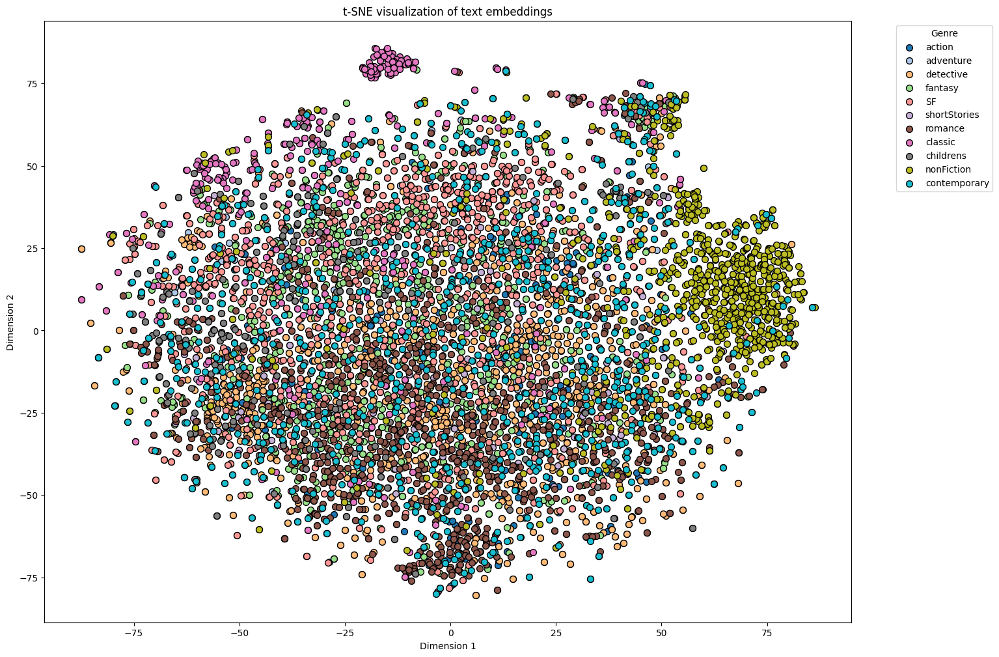

In [ ]:
# !pip install sentence-transformers
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from sentence_transformers import SentenceTransformer
# from sklearn.manifold import TSNE

# # 1. Load the data from the CSV file
# # df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset_all_pos_dir_multiclass.csv')
# # df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Multiclassification_dataset/dataset_all_pos_dir_multiclass_first_chunk.csv')
# df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Multiclassification_dataset/dataset_all_pos_dir_multiclass_without_punc_FILTERED_nun.csv')
# # df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Multiclassification_dataset/dataset_all_pos_dir_multiclass_low_case.csv')

# # 2. Extract the text data
# corpus = df['text'].tolist()

# # 3. Load a pretrained Sentence Transformer model
# model = SentenceTransformer('DeepPavlov/rubert-base-cased')

# # 4. Generate embeddings for the text data
# embeddings = model.encode(corpus, show_progress_bar=True)

# # 7. Load categories
# categories = df['label'].tolist()

# # 8. Create a mapping from labels to genre names
# label_to_genre = {
#     0: 'action',
#     1: 'adventure',
#     2: 'detective',
#     3: 'fantasy',
#     4: 'SF',
#     5: 'shortStories',
#     6: 'romance',
#     7: 'classic',
#     8: 'childrens',
#     9: 'nonFiction',
#     10: 'contemporary'
# }

# # 9. Apply t-SNE to the embeddings to reduce dimensionality to 2D
# tsne = TSNE(n_components=2, random_state=42)
# embeddings_tsne = tsne.fit_transform(embeddings)

# # 10. Create a scatter plot to visualize the embeddings
# plt.figure(figsize=(16, 12))

# # Get unique categories and create a color map
# unique_categories = sorted(set(categories))  # Ensure categories are sorted for consistent color mapping
# colors = plt.cm.get_cmap('tab20', len(unique_categories))  # Use 'tab20' colormap
# category_to_color = {category: colors(i) for i, category in enumerate(unique_categories)}

# # Plot each category with a different color
# for category in unique_categories:
#     indices = [i for i, cat in enumerate(categories) if cat == category]
#     plt.scatter(X_tsne[indices, 0], X_tsne[indices, 1], c=[category_to_color[category]], label=label_to_genre[category], edgecolor='k', s=50)

# # Add labels and legend
# plt.xlabel('Dimension 1')
# plt.ylabel('Dimension 2')
# plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.title('t-SNE visualization of text embeddings')
# plt.show()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from sklearn.manifold import TSNE

# 1. Load the data from the CSV file
# df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Multiclassification_dataset/dataset_all_pos_dir_multiclass_without_punc_FILTERED_nun.csv')
# df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Multiclassification_dataset/dataset_all_pos_dir_multiclass_first_chunk.csv')
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Multiclassification_dataset/dataset_all_pos_dir_multiclass_low_case.csv')

# 2. Extract the text data
corpus = df['text'].tolist()

# 3. Load a pretrained Sentence Transformer model
model = SentenceTransformer('DeepPavlov/rubert-base-cased')

# 4. Generate embeddings for the text data
embeddings = model.encode(corpus, show_progress_bar=True)

# 7. Load categories
categories = df['label'].tolist()

# 8. Create a mapping from labels to genre names
label_to_genre = {
    0: 'action',
    1: 'adventure',
    2: 'detective',
    3: 'fantasy',
    4: 'SF',
    5: 'shortStories',
    6: 'romance',
    7: 'classic',
    8: 'childrens',
    9: 'nonFiction',
    10: 'contemporary'
}

# 9. Apply t-SNE to the embeddings to reduce dimensionality to 2D
tsne = TSNE(n_components=2, random_state=42)
embeddings_tsne = tsne.fit_transform(embeddings)

# 10. Create a scatter plot to visualize the embeddings
plt.figure(figsize=(16, 12))

# Get unique categories and create a color map
unique_categories = sorted(set(categories))  # Ensure categories are sorted for consistent color mapping
colors = plt.colormaps['tab20']  # Use the new colormap syntax without passing the length of categories
category_to_color = {category: colors(i / len(unique_categories)) for i, category in enumerate(unique_categories)}

# Plot each category with a different color
for category in unique_categories:
    indices = [i for i, cat in enumerate(categories) if cat == category]
    plt.scatter(embeddings_tsne[indices, 0], embeddings_tsne[indices, 1], c=[category_to_color[category]], label=label_to_genre[category], edgecolor='k', s=50)

# Add labels and legend
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('t-SNE visualization of text embeddings')
plt.show()




##SE-ML Bert

config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/714M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Batches:   0%|          | 0/225 [00:00<?, ?it/s]

<ipython-input-9-5f4ac57e78e6>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(unique_categories))  # Use 'tab20' colormap


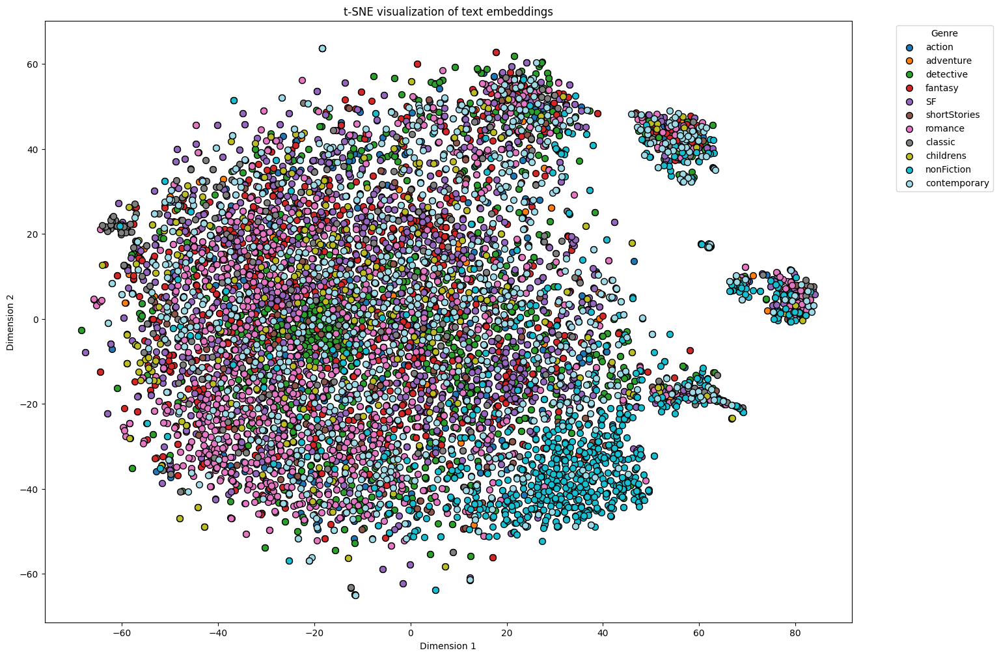

In [ ]:
!pip install sentence-transformers
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from sklearn.manifold import TSNE

# 1. Load the data from the CSV file
# df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset_all_pos_dir_multiclass.csv')
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Multiclassification_dataset/dataset_all_pos_dir_multiclass_without_punc_FILTERED_nun.csv')

# 2. Extract the text data
corpus = df['text'].tolist()

# 3. Load a pretrained Sentence Transformer model
model = SentenceTransformer('bert-base-multilingual-cased')

# 4. Generate embeddings for the text data
embeddings = model.encode(corpus, show_progress_bar=True)

# 7. Load categories
categories = df['label'].tolist()

# 8. Create a mapping from labels to genre names
label_to_genre = {
    0: 'action',
    1: 'adventure',
    2: 'detective',
    3: 'fantasy',
    4: 'SF',
    5: 'shortStories',
    6: 'romance',
    7: 'classic',
    8: 'childrens',
    9: 'nonFiction',
    10: 'contemporary'
}

# 9. Apply t-SNE to the embeddings to reduce dimensionality to 2D
tsne = TSNE(n_components=2, random_state=42)
embeddings_tsne = tsne.fit_transform(embeddings)

# 10. Create a scatter plot to visualize the embeddings
plt.figure(figsize=(16, 12))

# Get unique categories and create a color map
unique_categories = sorted(set(categories))  # Ensure categories are sorted for consistent color mapping
colors = plt.cm.get_cmap('tab20', len(unique_categories))  # Use 'tab20' colormap
category_to_color = {category: colors(i) for i, category in enumerate(unique_categories)}

# Plot each category with a different color
for category in unique_categories:
    indices = [i for i, cat in enumerate(categories) if cat == category]
    plt.scatter(embeddings_tsne[indices, 0], embeddings_tsne[indices, 1], c=[category_to_color[category]], label=label_to_genre[category], edgecolor='k', s=50)

# Add labels and legend
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('t-SNE visualization of text embeddings')
plt.show()
